# 0. Estadísticas (Stats) - Notebook

In [1]:
#Imports
import os
import sqlite3
import folium
import numpy as np
import pandas as pd
import geopandas as gpd
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import statsmodels.api as sm
from shapely import affinity
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap
from matplotlib.ticker import PercentFormatter

## 1. Estadísticas de elecciones generales

In [2]:
# Configuración de la ruta SQL
try:
    # Asume que el notebook está en elecciones-espana
    PROJECT_ROOT = Path.cwd().parent  # Sube 2 niveles desde la carpeta actual
    DB_PATH = PROJECT_ROOT / "data" / "processed" / "resultados_elecciones.sqlite"
    
    print(f"🔍 Ruta buscada: {DB_PATH.absolute()}")
    
    if not DB_PATH.exists():
        raise FileNotFoundError("¡Archivo no encontrado! Verifica la estructura del proyecto.")
    
except Exception as e:
    print(f"❌ Error configurando rutas: {e}")
    raise

# Función para cargar datos con verificación
def load_data(table_name="resultados"):
    try:
        conn = sqlite3.connect(str(DB_PATH))
        cursor = conn.cursor()
        
        # Verificar tablas disponibles
        cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
        tables = cursor.fetchall()
        print(f"📊 Tablas disponibles: {[t[0] for t in tables]}")
        
        if not any(table_name in t for t in tables):
            raise ValueError(f"Tabla '{table_name}' no encontrada")
            
        df = pd.read_sql(f"SELECT * FROM {table_name}", conn)
        print(f"✅ Datos cargados: {len(df)} registros")
        return df
        
    except sqlite3.Error as e:
        print(f"🚨 Error de base de datos: {e}")
        return None
    finally:
        conn.close()

# Cargar datos
df = load_data("resultados_generales")

🔍 Ruta buscada: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
📊 Tablas disponibles: ['resultados_generales']
✅ Datos cargados: 103 registros


### 1.1 - Gráfico votantes brutos y franja horaria

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


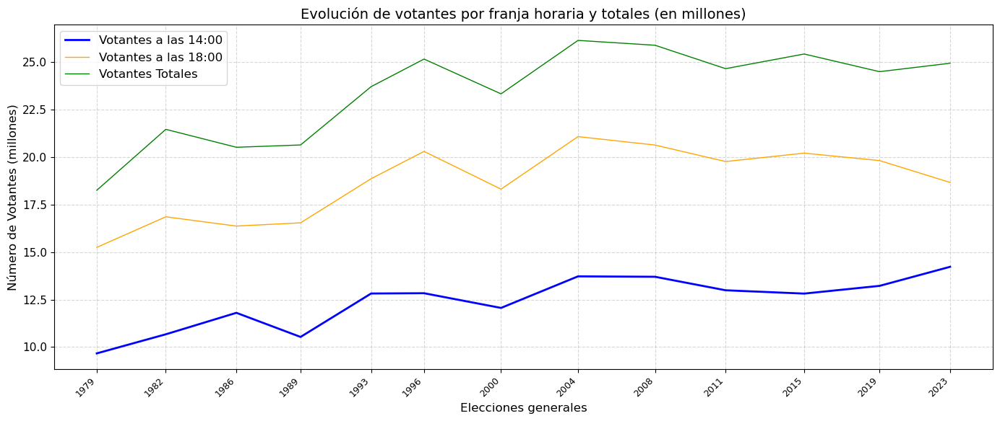

In [8]:
# --- Configuración de la conexión a la base de datos ---
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# --- Cargar datos ---
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# --- Filtrar solo los datos de votación ---
df_votantes = df[df["Dato"].isin([
    "Votantes a las 14:00",
    "Votantes a las 18:00",
    "Votantes"
])].copy()

# --- Traducir meses al inglés ---
meses_map = {
    "Enero": "January", "Febrero": "February", "Marzo": "March", "Abril": "April",
    "Mayo": "May", "Junio": "June", "Julio": "July", "Agosto": "August",
    "Septiembre": "September", "Octubre": "October", "Noviembre": "November", "Diciembre": "December"
}
df_votantes["Mes_ingles"] = df_votantes["Mes"].map(meses_map)
df_votantes["Fecha"] = pd.to_datetime(df_votantes["Mes_ingles"] + " " + df_votantes["Año"].astype(str), format="%B %Y")
df_votantes = df_votantes.sort_values("Fecha")

# --- Pivotar datos ---
df_pivot = df_votantes.pivot_table(
    index=["Año", "Mes", "Fecha", "¿GobiernoFormado?", "PartidoFormadorGobierno"],
    columns="Dato",
    values="Valor"
).reset_index()

# --- Convertir valores a millones ---
for col in ["Votantes a las 14:00", "Votantes a las 18:00", "Votantes"]:
    df_pivot[col] = pd.to_numeric(df_pivot[col], errors="coerce")

df_pivot["Votantes14_Mill"] = df_pivot["Votantes a las 14:00"] / 1_000_000
df_pivot["Votantes18_Mill"] = df_pivot["Votantes a las 18:00"] / 1_000_000
df_pivot["Votantes_Mill"] = df_pivot["Votantes"] / 1_000_000

# --- Crear etiquetas dinámicas: solo año, excepto en elecciones dobles ---
conteo_años = df_pivot["Año"].value_counts()

def generar_etiqueta(row):
    if conteo_años[row["Año"]] > 1:
        return row["Fecha"].strftime("%Y-%m")
    else:
        return str(row["Año"])

df_pivot["EtiquetaEleccion"] = df_pivot.apply(generar_etiqueta, axis=1)

# --- Graficar ---
fig, ax = plt.subplots(figsize=(14, 6))

ax.plot(df_pivot["Fecha"], df_pivot["Votantes14_Mill"], label="Votantes a las 14:00", linewidth=2, color="blue")
ax.plot(df_pivot["Fecha"], df_pivot["Votantes18_Mill"], label="Votantes a las 18:00", linewidth=1, color="orange")
ax.plot(df_pivot["Fecha"], df_pivot["Votantes_Mill"], label="Votantes Totales", linewidth=1, color="green")

# Etiquetas del eje X
ax.set_xticks(df_pivot["Fecha"])
ax.set_xticklabels(df_pivot["EtiquetaEleccion"], rotation=45, ha='right', fontsize=9)

# Estética
ax.set_title("Evolución de votantes por franja horaria y totales (en millones)")
ax.set_xlabel("Elecciones generales")
ax.set_ylabel("Número de Votantes (millones)")
ax.grid(visible=True, linestyle="--", alpha=0.5)
ax.legend()
plt.tight_layout()
plt.show()

### 1.2 - Correlación polinómica de la participación total bruta

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite


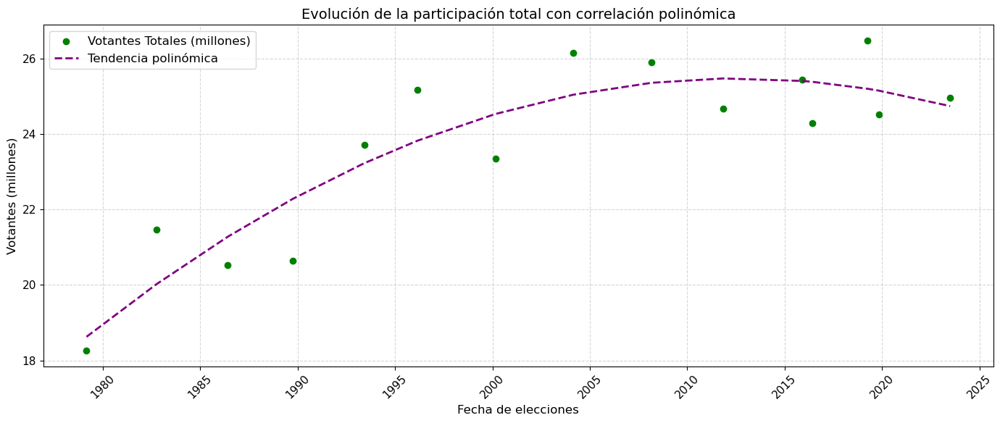

In [10]:
# --- Configuración de la conexión a la base de datos ---
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# --- Cargar datos ---
df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)

# --- Traducir meses al inglés ---
meses_map = {
    "Enero": "January", "Febrero": "February", "Marzo": "March", "Abril": "April",
    "Mayo": "May", "Junio": "June", "Julio": "July", "Agosto": "August",
    "Septiembre": "September", "Octubre": "October", "Noviembre": "November", "Diciembre": "December"
}

# --- Preparar datos ---
df_votantes = df[df["Dato"] == "Votantes"].copy()
df_votantes["Mes_ingles"] = df_votantes["Mes"].map(meses_map)
df_votantes["Fecha"] = pd.to_datetime(df_votantes["Mes_ingles"] + " " + df_votantes["Año"].astype(str), format="%B %Y")
df_votantes["Votantes_Mill"] = pd.to_numeric(df_votantes["Valor"], errors="coerce") / 1_000_000

# --- Limpiar ---
df_votantes = df_votantes.dropna(subset=["Votantes_Mill", "Fecha"])
df_votantes["FechaNum"] = df_votantes["Fecha"].map(pd.Timestamp.toordinal)

# --- Regresión polinómica (grado 2) ---
x = df_votantes["FechaNum"].values
y = df_votantes["Votantes_Mill"].values

coef = np.polyfit(x, y, 2)
modelo = np.poly1d(coef)

# --- Predicción ordenada ---
x_sorted = np.sort(x)
y_pred = modelo(x_sorted)
x_fechas = [pd.Timestamp.fromordinal(int(xi)) for xi in x_sorted]

# --- Graficar ---
plt.figure(figsize=(14, 6))
plt.scatter(df_votantes["Fecha"], df_votantes["Votantes_Mill"], color="green", label="Votantes Totales (millones)")
plt.plot(x_fechas, y_pred, color="purple", linestyle="--", linewidth=2, label="Tendencia polinómica")

plt.title("Evolución de la participación total con correlación polinómica")
plt.xlabel("Fecha de elecciones")
plt.ylabel("Votantes (millones)")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


### 1.3 - Gráfico votantes porcentuales y franja horaria

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


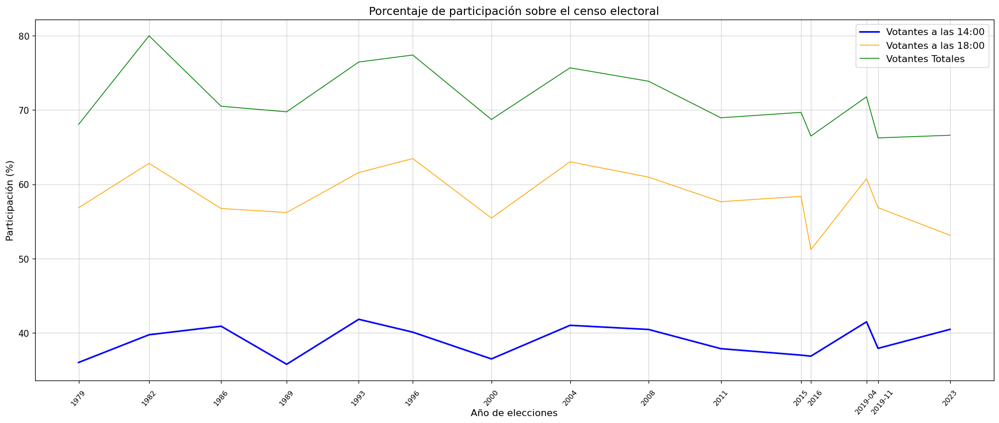

In [5]:
# Configuración de la conexión a la base de datos ---
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# Cargar datos
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# Estilo general (para fuente y proporción)
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
})

# Mapear meses del español al inglés
meses_map = {
    "Enero": "January", "Febrero": "February", "Marzo": "March", "Abril": "April",
    "Mayo": "May", "Junio": "June", "Julio": "July", "Agosto": "August",
    "Septiembre": "September", "Octubre": "October", "Noviembre": "November", "Diciembre": "December"
}

# Filtrar y preparar los datos
df_votantes = df[df["Dato"].isin(["Votantes a las 14:00", "Votantes a las 18:00", "Votantes"])].copy()
df_votantes["Mes_ingles"] = df_votantes["Mes"].map(meses_map)
df_votantes["Fecha"] = pd.to_datetime(df_votantes["Mes_ingles"] + " " + df_votantes["Año"].astype(str), format="%B %Y")
df_votantes["Etiqueta_Eleccion"] = df_votantes["Fecha"].dt.strftime('%Y-%m')  # Etiqueta legible
df_votantes["Porcentaje"] = pd.to_numeric(df_votantes["Porcentaje"], errors="coerce")

# Pivotear los datos
df_pct = df_votantes.pivot_table(
    index=["Fecha", "Etiqueta_Eleccion"],
    columns="Dato",
    values="Porcentaje"
).reset_index()

df_pct.rename(columns={
    "Votantes a las 14:00": "%Votantes14",
    "Votantes a las 18:00": "%Votantes18",
    "Votantes": "%VotantesTotales"
}, inplace=True)

# Graficar
fig, ax = plt.subplots(figsize=(18, 8))  # Aumentar altura visual

ax.plot(df_pct["Fecha"], df_pct["%Votantes14"], label="Votantes a las 14:00", linewidth=2, color="blue")
ax.plot(df_pct["Fecha"], df_pct["%Votantes18"], label="Votantes a las 18:00", linewidth=1, color="orange")
ax.plot(df_pct["Fecha"], df_pct["%VotantesTotales"], label="Votantes Totales", linewidth=1, color="green")

# Eje X con fechas como ticks
ax.set_xticks(df_pct["Fecha"].tolist())

# Mostrar solo año, excepto si hubo dos elecciones en ese año
etiquetas = []
for fecha in df_pct["Fecha"]:
    año = fecha.year
    if (df_pct["Fecha"].dt.year == año).sum() > 1:
        etiquetas.append(fecha.strftime("%Y-%m"))
    else:
        etiquetas.append(str(año))

# Eliminar etiquetas duplicadas del eje X
ax.set_xticklabels([])  # Para evitar solapamiento

# Dibujar manualmente las etiquetas, desplazando las específicas
y_pos = ax.get_ylim()[0] - 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0])

for fecha in df_pct["Fecha"]:
    año = fecha.year
    mes = fecha.month

    # Etiqueta personalizada según el número de elecciones por año
    if (df_pct["Fecha"].dt.year == año).sum() > 1:
        etiqueta = fecha.strftime("%Y-%m")
    else:
        etiqueta = str(año)

    # Desplazar etiquetas específicas
    if etiqueta in ["2016", "2019-11"]:
        offset = pd.Timedelta(days=80)
    else:
        offset = pd.Timedelta(days=0)

    ax.text(fecha + offset, y_pos, etiqueta, ha='center', va='top', rotation=50, fontsize=9)

# Estética general
ax.set_title("Porcentaje de participación sobre el censo electoral")
ax.set_xlabel("Año de elecciones", labelpad=28)
ax.set_ylabel("Participación (%)")
ax.grid(True, linestyle="-", alpha=0.5)
ax.legend()
fig.tight_layout(pad=2.5)
plt.show()

### 1.4 - Correlación polinómica de participación porcentual bruta

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


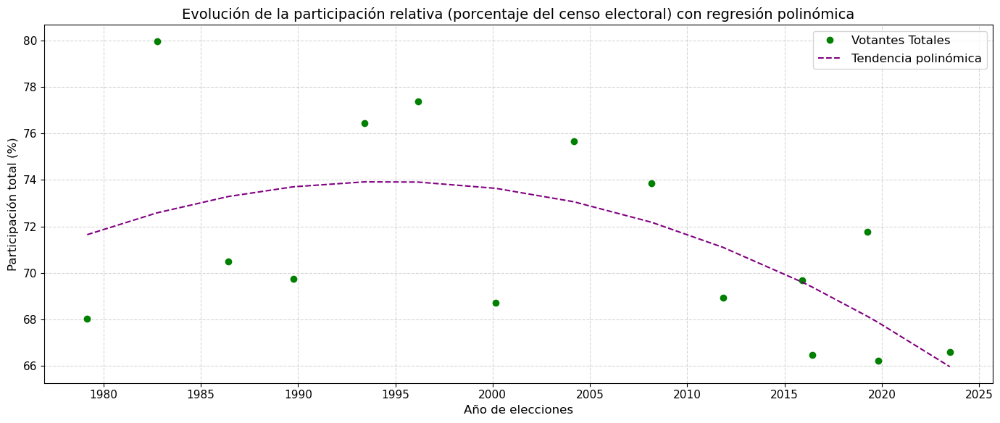

In [6]:
# Configuración de la conexión a la base de datos
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# Cargar datos relevantes
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# Mapear meses
meses_map = {
    "Enero": "January", "Febrero": "February", "Marzo": "March", "Abril": "April",
    "Mayo": "May", "Junio": "June", "Julio": "July", "Agosto": "August",
    "Septiembre": "September", "Octubre": "October", "Noviembre": "November", "Diciembre": "December"
}

# Filtrar solo votantes totales
df_votantes = df[df["Dato"] == "Votantes"].copy()
df_votantes["Mes_ingles"] = df_votantes["Mes"].map(meses_map)
df_votantes["Fecha"] = pd.to_datetime(df_votantes["Mes_ingles"] + " " + df_votantes["Año"].astype(str), format="%B %Y")
df_votantes["FechaExacta"] = df_votantes["Fecha"].dt.to_period("M").dt.start_time
df_votantes["Porcentaje"] = pd.to_numeric(df_votantes["Porcentaje"], errors="coerce")

# Preparar datos
df_regresion = df_votantes[["FechaExacta", "Porcentaje"]].dropna()
df_regresion["FechaNum"] = df_regresion["FechaExacta"].map(pd.Timestamp.toordinal)

# Crear modelo polinómico de grado 2
x = df_regresion["FechaNum"].values
y = df_regresion["Porcentaje"].values
poly_features = np.polyfit(x, y, 2)
poly_model = np.poly1d(poly_features)

# Crear predicciones ordenadas
x_sorted = np.sort(x)
y_poly_pred = poly_model(x_sorted)
x_dates_sorted = [pd.Timestamp.fromordinal(int(val)) for val in x_sorted]

# Graficar
plt.figure(figsize=(14, 6))
plt.plot(df_regresion["FechaExacta"], y, "o", label="Votantes Totales", color="green")
plt.plot(x_dates_sorted, y_poly_pred, "--", label="Tendencia polinómica", color="purple")
plt.title("Evolución de la participación relativa (porcentaje del censo electoral) con regresión polinómica")
plt.xlabel("Año de elecciones")
plt.ylabel("Participación total (%)")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

### 1.5 - Gráfico participación sobre el censo electoral con periodos de gobierno

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


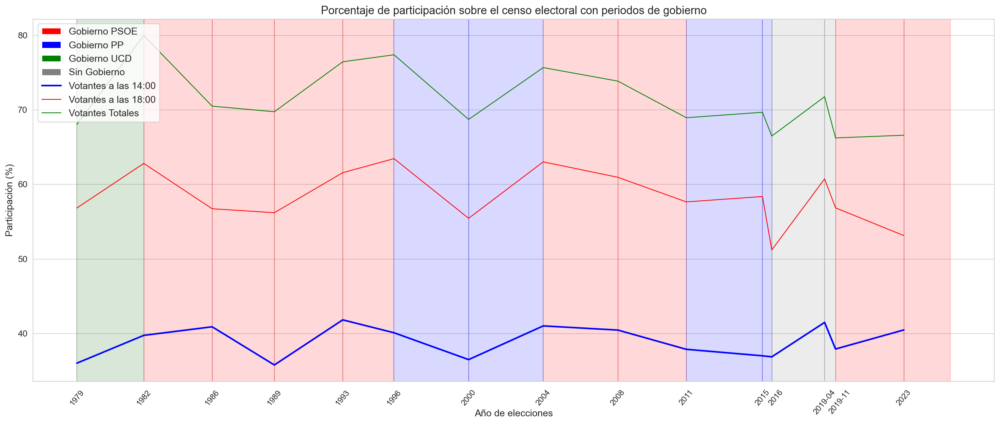

In [178]:
# Conectar al archivo SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# Cargar datos relevantes
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# Estilo general (para fuente y proporción)
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
})

fig, ax = plt.subplots(figsize=(18, 8))  # Aumentar altura visual

# Fondo por gobierno
colores_partido = {
    "PSOE": "red",
    "PP": "blue",
    "UCD": "darkgreen",
    "Sin Gobierno": "grey"
}

leyenda_colores = [
    Patch(facecolor="red", label="Gobierno PSOE"),
    Patch(facecolor="blue", label="Gobierno PP"),
    Patch(facecolor="green", label="Gobierno UCD"),
    Patch(facecolor="grey", label="Sin Gobierno")
]
df_periodos = pd.DataFrame([
    {"Inicio": "1979-03-01", "Fin": "1982-10-01", "PartidoFormadorGobierno": "UCD"},
    {"Inicio": "1982-10-01", "Fin": "1986-06-01", "PartidoFormadorGobierno": "PSOE"},
    {"Inicio": "1986-06-01", "Fin": "1989-10-01", "PartidoFormadorGobierno": "PSOE"},
    {"Inicio": "1989-10-01", "Fin": "1993-06-01", "PartidoFormadorGobierno": "PSOE"},
    {"Inicio": "1993-06-01", "Fin": "1996-03-01", "PartidoFormadorGobierno": "PSOE"},
    {"Inicio": "1996-03-01", "Fin": "2000-03-01", "PartidoFormadorGobierno": "PP"},
    {"Inicio": "2000-03-01", "Fin": "2004-03-01", "PartidoFormadorGobierno": "PP"},
    {"Inicio": "2004-03-01", "Fin": "2008-03-01", "PartidoFormadorGobierno": "PSOE"},
    {"Inicio": "2008-03-01", "Fin": "2011-11-01", "PartidoFormadorGobierno": "PSOE"},
    {"Inicio": "2011-11-01", "Fin": "2015-12-01", "PartidoFormadorGobierno": "PP"},
    {"Inicio": "2015-12-01", "Fin": "2016-06-01", "PartidoFormadorGobierno": "PP"},
    {"Inicio": "2016-06-01", "Fin": "2019-04-01", "PartidoFormadorGobierno": "Sin Gobierno"},
    {"Inicio": "2019-04-01", "Fin": "2019-11-01", "PartidoFormadorGobierno": "Sin Gobierno"},
    {"Inicio": "2019-11-01", "Fin": "2023-07-01", "PartidoFormadorGobierno": "PSOE"},
    {"Inicio": "2023-07-01", "Fin": "2025-12-31", "PartidoFormadorGobierno": "PSOE"}
])
df_periodos["Inicio"] = pd.to_datetime(df_periodos["Inicio"])
df_periodos["Fin"] = pd.to_datetime(df_periodos["Fin"])

for _, row in df_periodos.iterrows():
    color = colores_partido.get(row["PartidoFormadorGobierno"], "white")
    alpha = 0.5 if color == "white" else 0.15
    ax.axvspan(row["Inicio"], row["Fin"], alpha=alpha, color=color)

# Mapear nombres de meses del español al inglés
meses_map = {
    "Enero": "January", "Febrero": "February", "Marzo": "March", "Abril": "April",
    "Mayo": "May", "Junio": "June", "Julio": "July", "Agosto": "August",
    "Septiembre": "September", "Octubre": "October", "Noviembre": "November", "Diciembre": "December"
}

df_votantes_pct = df[df["Dato"].isin(["Votantes a las 14:00", "Votantes a las 18:00", "Votantes"])].copy()
df_votantes_pct["Mes_ingles"] = df_votantes_pct["Mes"].map(meses_map)
df_votantes_pct["Fecha"] = pd.to_datetime(df_votantes_pct["Mes_ingles"] + " " + df_votantes_pct["Año"].astype(str), format="%B %Y")
df_votantes_pct["FechaExacta"] = df_votantes_pct["Fecha"].dt.to_period("M").dt.start_time
df_votantes_pct["Porcentaje"] = pd.to_numeric(df_votantes_pct["Porcentaje"], errors="coerce")

df_pct = df_votantes_pct.pivot_table(
    index=["FechaExacta"],
    columns="Dato",
    values="Porcentaje",
    aggfunc='first'
).reset_index()

df_pct.rename(columns={
    "Votantes a las 14:00": "%Votantes14",
    "Votantes a las 18:00": "%Votantes18",
    "Votantes": "%VotantesTotales"
}, inplace=True)

# Líneas de votantes
ax.plot(df_pct["FechaExacta"], df_pct["%Votantes14"], label="Votantes a las 14:00", linewidth=2, color="blue")
ax.plot(df_pct["FechaExacta"], df_pct["%Votantes18"], label="Votantes a las 18:00", linewidth=1, color="red")
ax.plot(df_pct["FechaExacta"], df_pct["%VotantesTotales"], label="Votantes Totales", linewidth=1, color="green")

fechas_xticks = [
    pd.Timestamp("1979-03-01"), pd.Timestamp("1982-10-01"), pd.Timestamp("1986-06-01"),
    pd.Timestamp("1989-10-01"), pd.Timestamp("1993-06-01"), pd.Timestamp("1996-03-01"),
    pd.Timestamp("2000-03-01"), pd.Timestamp("2004-03-01"), pd.Timestamp("2008-03-01"),
    pd.Timestamp("2011-11-01"), pd.Timestamp("2015-12-01"), pd.Timestamp("2016-06-01"),
    pd.Timestamp("2019-04-01"), pd.Timestamp("2019-11-01"), pd.Timestamp("2023-07-01")
]

etiquetas_xticks = [
    "1979", "1982", "1986", "1989", "1993", "1996", "2000", "2004", "2008", "2011",
    "2015", "2016", "2019-04", "2019-11", "2023"
]

ax.set_xticks(fechas_xticks)
ax.set_xticklabels([])

y_pos = ax.get_ylim()[0] - 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0])
for fecha, etiqueta in zip(fechas_xticks, etiquetas_xticks):
    offset_x = pd.Timedelta(days=80) if etiqueta in ["2016", "2019-11"] else pd.Timedelta(days=0)
    ax.text(fecha + offset_x, y_pos, etiqueta, ha='center', va='top', rotation=50, fontsize=10)

# Leyenda
ax.xaxis.labelpad = 25
ax.legend(handles=leyenda_colores + ax.get_lines(), loc="upper left", fontsize=12)
ax.set_title("Porcentaje de participación sobre el censo electoral con periodos de gobierno")
ax.set_xlabel("Año de elecciones", labelpad=28)
ax.set_ylabel("Participación (%)")
ax.grid(True, axis="y", linestyle="-", alpha=0.4, linewidth=0.7, color="grey")

# Más espacio interno
fig.tight_layout(pad=2.5)
plt.show()

### 1.6 - Diagrama barras partido gobernante y participación a las 14:00

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


<Figure size 1000x600 with 0 Axes>

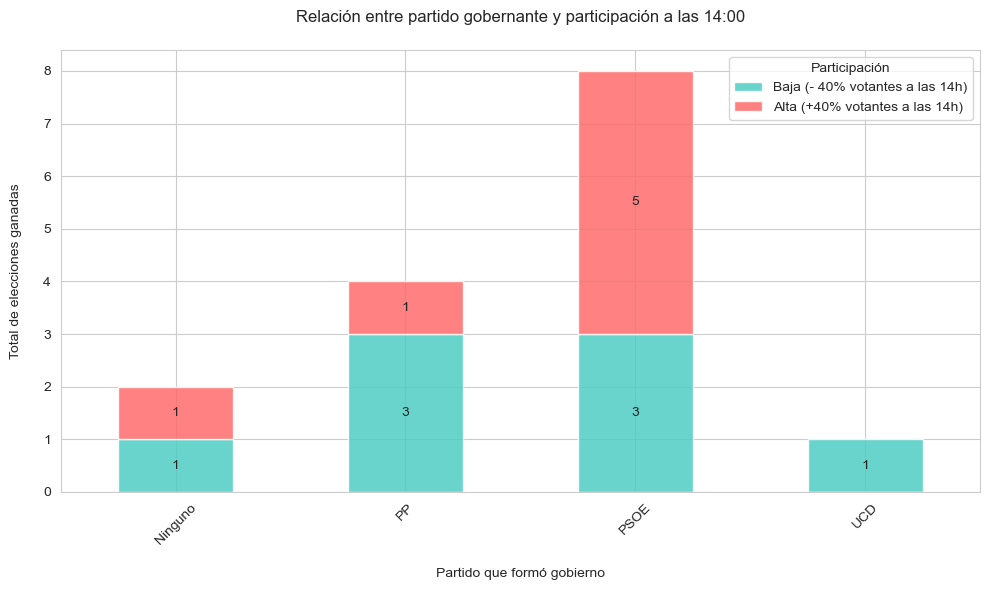

In [24]:
# === Configuración de la conexión a la base de datos ===
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar y preparar datos ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# === Filtrar solo los datos de participación a las 14:00 ===
df_14h = df[df["Dato"] == "Votantes a las 14:00"].copy()

# Limpiar columnas necesarias
df_14h["Participacion_14h"] = pd.to_numeric(df_14h["Porcentaje"], errors="coerce")
df_14h["Partido_Gobierno"] = df_14h["PartidoFormadorGobierno"].fillna("Ninguno")

# Clasificación binaria: Alta participación si > 40%
df_14h["Alta_Participacion"] = (df_14h["Participacion_14h"] > 40).astype(int)

# === GRÁFICO CORRECTO ===
plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")

# Tabla cruzada
cross_tab = pd.crosstab(df_14h['Partido_Gobierno'], df_14h['Alta_Participacion'])

# Reordenar columnas para que ≤40% aparezca primero
cross_tab = cross_tab[[0, 1]] if 0 in cross_tab.columns and 1 in cross_tab.columns else cross_tab

# Colores: azul verdoso y rojo
ax = cross_tab.plot(kind='bar', stacked=True,
                    color=['#4ECDC4', '#FF6B6B'],
                    alpha=0.85, figsize=(10, 6))

# Estética
plt.title("Relación entre partido gobernante y participación a las 14:00", pad=20)
plt.xlabel("Partido que formó gobierno", labelpad=15)
plt.ylabel("Total de elecciones ganadas", labelpad=15)
plt.xticks(rotation=45)
plt.legend(['Baja (- 40% votantes a las 14h)', 'Alta (+40% votantes a las 14h)'], title="Participación")

# Añadir etiquetas centradas
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        x = p.get_x() + p.get_width() / 2
        y = p.get_y() + height / 2
        ax.annotate(f'{int(height)}', (x, y), ha='center', va='center')

plt.tight_layout()
plt.show()


### 1.7 - Diagrama barras partido gobernante y participación a las 18:00

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


<Figure size 1000x600 with 0 Axes>

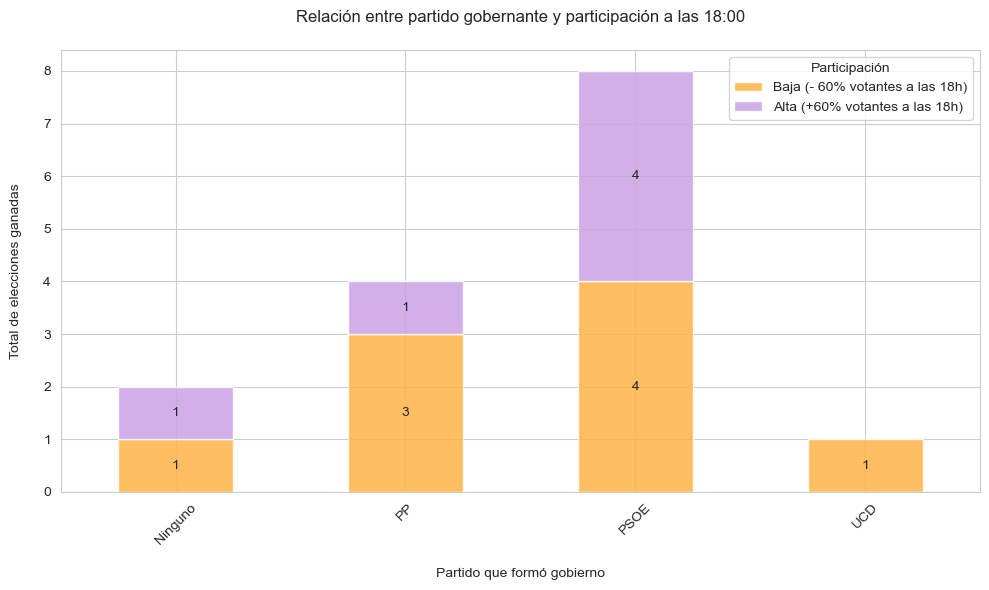

In [25]:
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar y preparar datos ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise
finally:
    conn.close()

# === Filtrar solo datos de participación a las 18:00 ===
df_18h = df[df["Dato"] == "Votantes a las 18:00"].copy()
df_18h["Partido_Gobierno"] = df_18h["PartidoFormadorGobierno"].fillna("Ninguno")

# Convertir a numérico
df_18h["Porcentaje"] = pd.to_numeric(df_18h["Porcentaje"], errors="coerce")

# Clasificar si la participación fue superior al 60%
df_18h["Alta_Participacion"] = (df_18h["Porcentaje"] > 60).astype(int)

# === GRÁFICO ===
plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")

# Tabla cruzada
cross_tab = pd.crosstab(df_18h["Partido_Gobierno"], df_18h["Alta_Participacion"])

# Reordenar columnas para que ≤60% aparezca primero
cross_tab = cross_tab[[0, 1]] if 0 in cross_tab.columns and 1 in cross_tab.columns else cross_tab

# Colores: naranja claro y lila claro
ax = cross_tab.plot(kind='bar', stacked=True,
                    color=['#FFB347', '#CBA3E3'],
                    alpha=0.85, figsize=(10, 6))

# Estética
plt.title("Relación entre partido gobernante y participación a las 18:00", pad=20)
plt.xlabel("Partido que formó gobierno", labelpad=15)
plt.ylabel("Total de elecciones ganadas", labelpad=15)
plt.xticks(rotation=45)
plt.legend(['Baja (- 60% votantes a las 18h)', 'Alta (+60% votantes a las 18h)'], title="Participación")

# Etiquetas centradas
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        x = p.get_x() + p.get_width() / 2
        y = p.get_y() + height / 2
        ax.annotate(f'{int(height)}', (x, y), ha='center', va='center')

plt.tight_layout()
plt.show()


### 1.8 - Diagrama barras partido gobernante y participación total

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


<Figure size 1000x600 with 0 Axes>

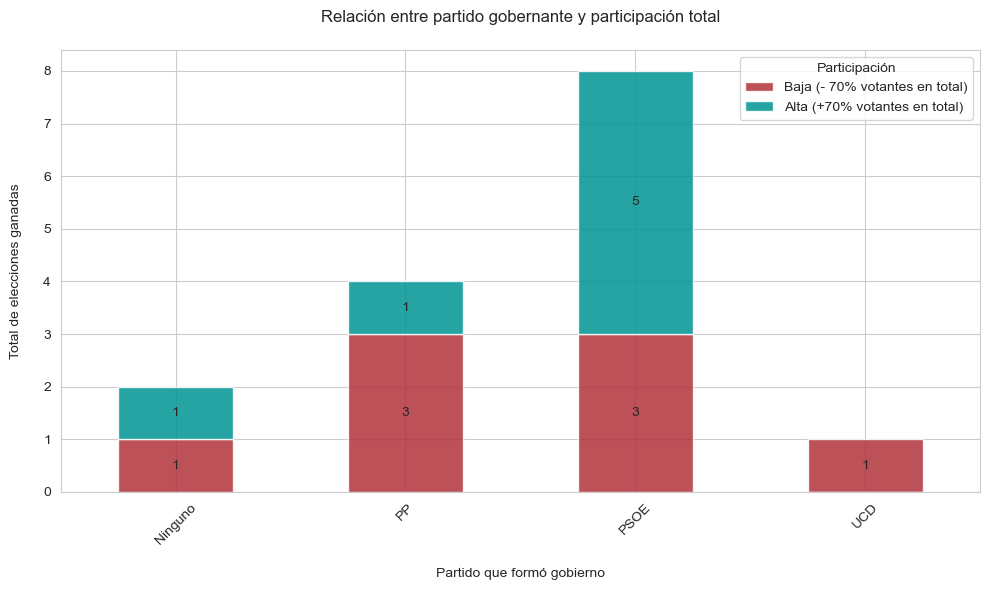

In [26]:
# === Configuración de la conexión a la base de datos ===
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar y preparar datos ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# === Filtrar solo datos de participación total ===
df_total = df[df["Dato"] == "Votantes"].copy()
df_total["Partido_Gobierno"] = df_total["PartidoFormadorGobierno"].fillna("Ninguno")

# Convertir a numérico
df_total["Porcentaje"] = pd.to_numeric(df_total["Porcentaje"], errors="coerce")

# Clasificar si la participación fue superior al 70%
df_total["Alta_Participacion"] = (df_total["Porcentaje"] > 70).astype(int)

# === GRÁFICO ===
plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")

# Tabla cruzada
cross_tab = pd.crosstab(df_total["Partido_Gobierno"], df_total["Alta_Participacion"])

# Reordenar columnas para que ≤70% aparezca primero
cross_tab = cross_tab[[0, 1]] if 0 in cross_tab.columns and 1 in cross_tab.columns else cross_tab

# Colores burdeos y cian oscuro
ax = cross_tab.plot(kind='bar', stacked=True,
                    color=['#B1323B', '#009494'],
                    alpha=0.85, figsize=(10, 6))

# Estética
plt.title("Relación entre partido gobernante y participación total", pad=20)
plt.xlabel("Partido que formó gobierno", labelpad=15)
plt.ylabel("Total de elecciones ganadas", labelpad=15)
plt.xticks(rotation=45)
plt.legend(['Baja (- 70% votantes en total)', 'Alta (+70% votantes en total)'], title="Participación")

# Etiquetas centradas
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        x = p.get_x() + p.get_width() / 2
        y = p.get_y() + height / 2
        ax.annotate(f'{int(height)}', (x, y), ha='center', va='center')

plt.tight_layout()
plt.show()

### 1.9 - Heatmap participación 14:00

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


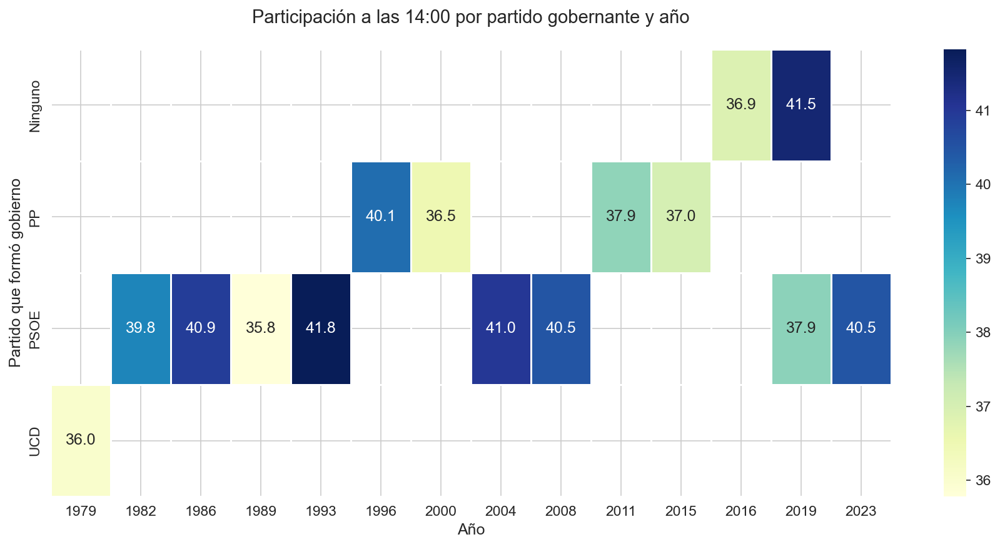

In [179]:
# === Configuración de la conexión a la base de datos ===
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar y preparar datos ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# === Filtrar participación a las 14:00 ===
df_14h = df[df["Dato"] == "Votantes a las 14:00"].copy()
df_14h["Participacion_14h"] = pd.to_numeric(df_14h["Porcentaje"], errors="coerce")
df_14h["Partido_Gobierno"] = df_14h["PartidoFormadorGobierno"].fillna("Ninguno")

# === Crear tabla dinámica para heatmap ===
heatmap_data = df_14h.pivot_table(
    index="Año",
    columns="Partido_Gobierno",
    values="Participacion_14h",
    aggfunc="mean"
)

# === Dibujar heatmap ===
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data.T, cmap="YlGnBu", annot=True, fmt=".1f", linewidths=0.5)

plt.title("Participación a las 14:00 por partido gobernante y año", pad=20)
plt.xlabel("Año")
plt.ylabel("Partido que formó gobierno")
plt.tight_layout()
plt.show()


### 1.10 - Heatmap participación 18:00

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


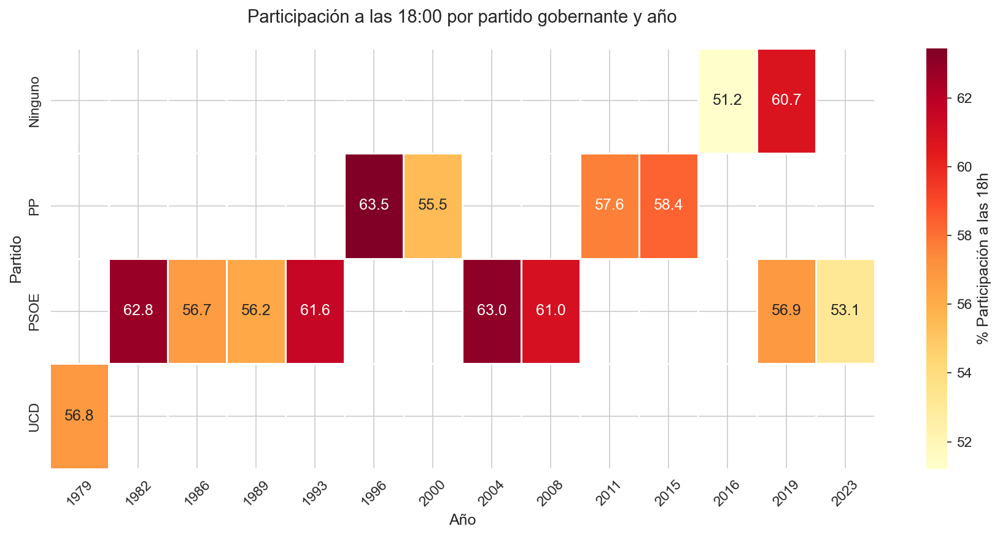

In [181]:
# === Configuración de la conexión a la base de datos ===
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar y preparar datos ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# === Filtrar participación a las 18:00 ===
df_18h = df[df["Dato"] == "Votantes a las 18:00"].copy()
df_18h["Participacion_18h"] = pd.to_numeric(df_18h["Porcentaje"], errors="coerce")
df_18h["Partido_Gobierno"] = df_18h["PartidoFormadorGobierno"].fillna("Ninguno")

# === Crear tabla dinámica para heatmap ===
heatmap_data = df_18h.pivot_table(
    index="Año",
    columns="Partido_Gobierno",
    values="Participacion_18h",
    aggfunc="mean"
)

# === Dibujar heatmap ===
plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_data.T,
    cmap="YlOrRd",  # Paleta cálida
    annot=True,
    fmt=".1f",
    linewidths=0.5,
    cbar_kws={'label': '% Participación a las 18h'}
)

# Personalización
plt.title("Participación a las 18:00 por partido gobernante y año", pad=20, fontsize=14)
plt.xlabel("Año", fontsize=12)
plt.ylabel("Partido", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### 1.11 - Heatmap participación total

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente desde la base de datos.


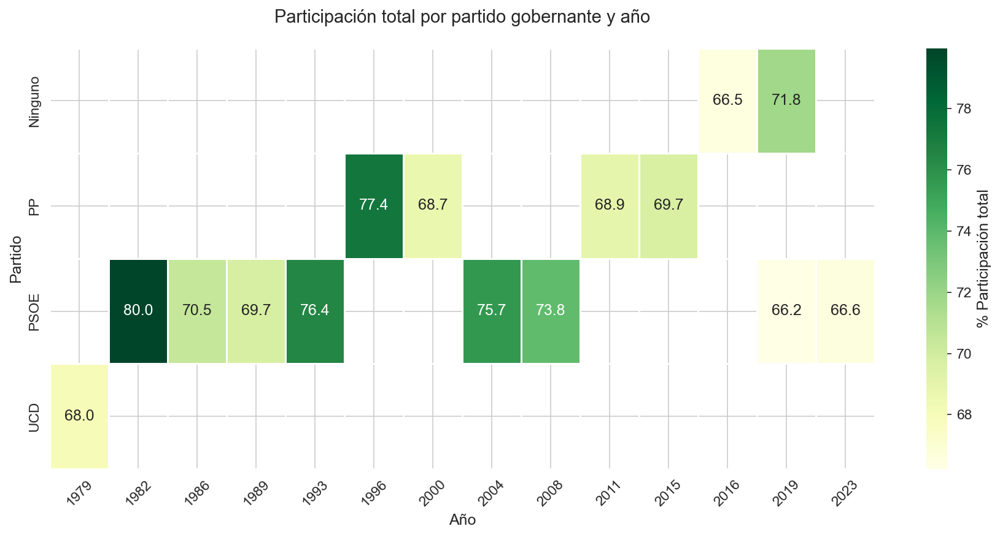

In [180]:
# === Conectar a la base de datos ===
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar y preparar datos ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# === Filtrar participación total ===
df_total = df[df["Dato"] == "Votantes"].copy()
df_total["Participacion_Total"] = pd.to_numeric(df_total["Porcentaje"], errors="coerce")
df_total["Partido_Gobierno"] = df_total["PartidoFormadorGobierno"].fillna("Ninguno")

# === Crear tabla dinámica para heatmap ===
heatmap_data = df_total.pivot_table(
    index="Año",
    columns="Partido_Gobierno",
    values="Participacion_Total",
    aggfunc="mean"
)

# === Dibujar heatmap ===
plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_data.T,
    cmap="YlGn",  # Paleta verde
    annot=True,
    fmt=".1f",
    linewidths=0.5,
    cbar_kws={'label': '% Participación total'}
)

# Personalización
plt.title("Participación total por partido gobernante y año", pad=20, fontsize=14)
plt.xlabel("Año", fontsize=12)
plt.ylabel("Partido", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



### 1.12 - Correlación visual victorias PSOE

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente.


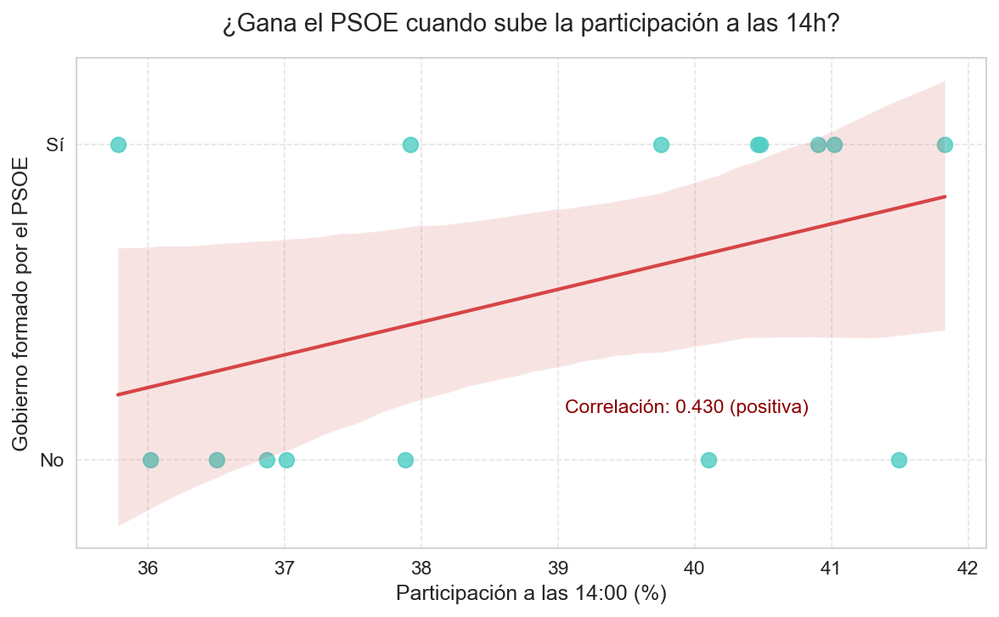

In [182]:
# === Configuración de la conexión a la base de datos ===
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar datos desde la tabla ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise
finally:
    conn.close()

# === Filtrar y preparar ===
df_14h = df[df["Dato"] == "Votantes a las 14:00"].copy()
df_14h["PSOE_Ganador"] = (df_14h["PartidoFormadorGobierno"] == "PSOE").astype(int)
df_14h["Participacion_14h"] = pd.to_numeric(df_14h["Porcentaje"], errors="coerce")

# Limpiar nulos
df_clean = df_14h[["PSOE_Ganador", "Participacion_14h"]].dropna()

# === Correlación ===
correlacion = df_clean["PSOE_Ganador"].corr(df_clean["Participacion_14h"])

# === Gráfico ===
plt.figure(figsize=(8, 5))
sns.set_style("whitegrid")

sns.regplot(
    x="Participacion_14h",
    y="PSOE_Ganador",
    data=df_clean,
    logistic=False,
    scatter_kws={'color': '#4ECDC4', 's': 70},
    line_kws={'color': '#D64545', 'lw': 2}
)

plt.title("¿Gana el PSOE cuando sube la participación a las 14h?", fontsize=14, pad=15)
plt.xlabel("Participación a las 14:00 (%)")
plt.ylabel("Gobierno formado por el PSOE")
plt.yticks([0, 1], ["No", "Sí"])
plt.grid(True, linestyle="--", alpha=0.5)
# === Anotar correlación dentro del gráfico (esquina inferior derecha) ===
plt.text(
    x=df_clean["Participacion_14h"].max() - 1,
    y=0.15,
    s=f"Correlación: {correlacion:.3f} (positiva)",
    fontsize=11,
    ha="right",
    color="#8B0000"
)
plt.tight_layout()
plt.show()

### 1.13 - Correlación visual victorias PP

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\resultados_elecciones.sqlite
Datos cargados exitosamente.


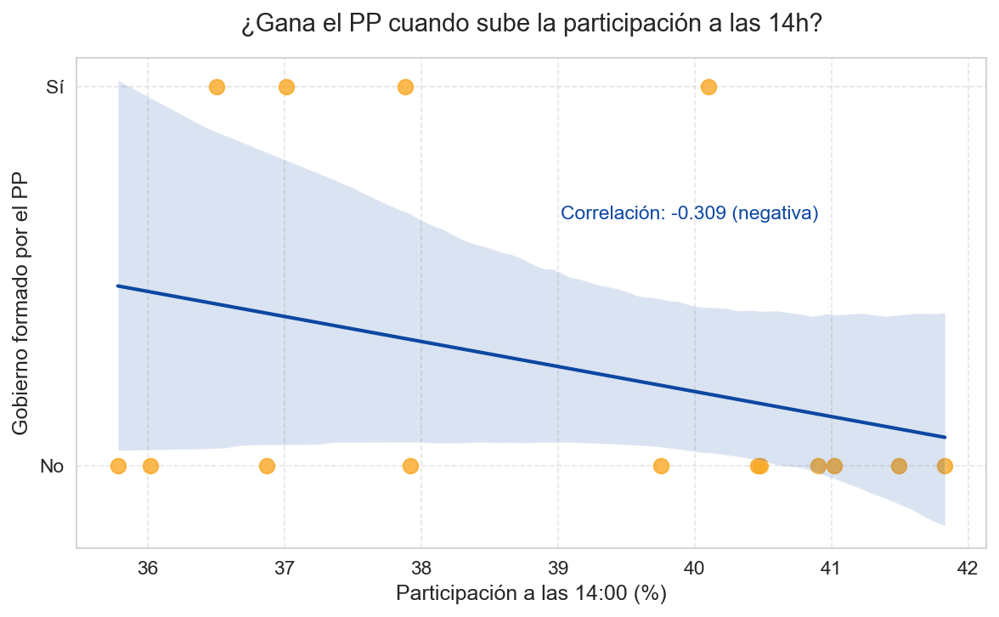

In [183]:
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# === Cargar datos ===
try:
    df = pd.read_sql_query("SELECT * FROM resultados_generales", conn)
    print("Datos cargados exitosamente.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# === Preparar datos para PP ===
df_14h = df[df["Dato"] == "Votantes a las 14:00"].copy()
df_14h["PP_Ganador"] = (df_14h["PartidoFormadorGobierno"] == "PP").astype(int)
df_14h["Participacion_14h"] = pd.to_numeric(df_14h["Porcentaje"], errors="coerce")

df_clean = df_14h[["PP_Ganador", "Participacion_14h"]].dropna()

# === Calcular correlación ===
correlacion = df_clean["PP_Ganador"].corr(df_clean["Participacion_14h"])

# === Gráfico ===
plt.figure(figsize=(8, 5))
sns.set_style("whitegrid")

sns.regplot(
    x="Participacion_14h",
    y="PP_Ganador",
    data=df_clean,
    logistic=False,
    scatter_kws={'color': '#F9A825', 's': 70},  # Amarillo fuerte para el PP
    line_kws={'color': '#0D47A1', 'lw': 2}      # Azul oscuro PP
)

plt.title("¿Gana el PP cuando sube la participación a las 14h?", fontsize=14, pad=15)
plt.xlabel("Participación a las 14:00 (%)")
plt.ylabel("Gobierno formado por el PP")
plt.yticks([0, 1], ["No", "Sí"])
plt.grid(True, linestyle="--", alpha=0.5)
# === Anotar correlación dentro del gráfico (esquina superior derecha) ===
plt.text(
    x=df_clean["Participacion_14h"].max() - 0.925,
    y=0.65,
    s=f"Correlación: {correlacion:.3f} (negativa)",
    fontsize=11,
    ha="right",
    color="#0D47A1"
)
plt.tight_layout()
plt.show()


## 2. Estadísticas de participación y renta

In [39]:
# Configuración de rutas
try:
    # Asume que el notebook está en elecciones-espana
    PROJECT_ROOT = Path.cwd().parent  # Sube 2 niveles desde la carpeta actual
    DB_PATH = PROJECT_ROOT / "data" / "processed" / "Renta_y_Participacion.sqlite"
    
    print(f"🔍 Ruta buscada: {DB_PATH.absolute()}")
    
    if not DB_PATH.exists():
        raise FileNotFoundError("¡Archivo no encontrado! Verifica la estructura del proyecto.")
    
except Exception as e:
    print(f"❌ Error configurando rutas: {e}")
    raise

# Función para cargar datos con verificación
def load_data(table_name="resultados"):
    try:
        conn = sqlite3.connect(str(DB_PATH))
        cursor = conn.cursor()
        
        # Verificar tablas disponibles (debugging útil)
        cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
        tables = cursor.fetchall()
        print(f"📊 Tablas disponibles: {[t[0] for t in tables]}")
        
        if not any(table_name in t for t in tables):
            raise ValueError(f"Tabla '{table_name}' no encontrada")
            
        df = pd.read_sql(f"SELECT * FROM {table_name}", conn)
        print(f"✅ Datos cargados: {len(df)} registros")
        return df
        
    except sqlite3.Error as e:
        print(f"🚨 Error de base de datos: {e}")
        return None
    finally:
        conn.close()

# Carga los datos
df = load_data("Renta_y_Participacion")


🔍 Ruta buscada: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
📊 Tablas disponibles: ['Renta_y_Participacion']
✅ Datos cargados: 27600 registros


### 2.1 - Geomapa de distribución de renta media por municipio en España (2015)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\1011908585.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.x < -10) &  # Longitud oeste
C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\1011908585.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.y < 40)     # Latitud sur



✅ Canarias desplazada correctamente

✅ Datos de renta cargados: 4568 registros válidos


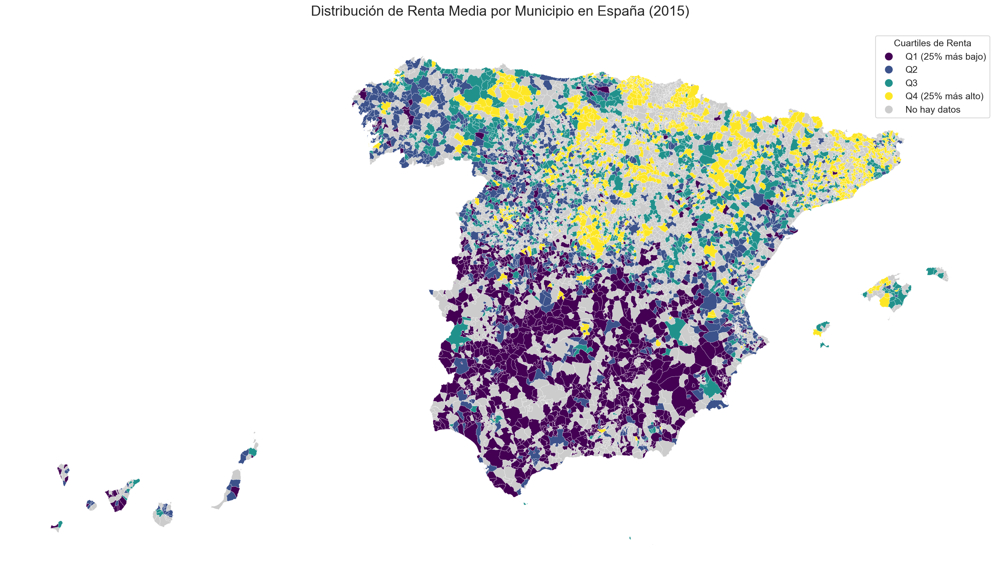

In [282]:
# 0. Conectar a la base de datos SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 1. Cargar el archivo GeoJSON correctamente
ROOT_DIR = Path(os.getcwd()).resolve()
while not (ROOT_DIR / "data").exists() and ROOT_DIR != ROOT_DIR.parent:
    ROOT_DIR = ROOT_DIR.parent

geojson_path = ROOT_DIR / "data" / "raw" / "Municipios_-3498985394491007638.geojson"

if not geojson_path.exists():
    raise FileNotFoundError(f"❌ No se encontró el archivo GeoJSON en: {geojson_path}")

mapa_munis = gpd.read_file(geojson_path)

# 2. Limpiar nombres de municipio
mapa_munis["Municipio"] = mapa_munis["NAMEUNIT"].str.upper().str.normalize("NFKD").str.replace("[^A-Z ]", "", regex=True)

# --- Desplazar Canarias ---

# Filtrar Canarias mediante coordenadas
canarias_mask = (
    (mapa_munis["geometry"].centroid.x < -10) &  # Longitud oeste
    (mapa_munis["geometry"].centroid.y < 40)     # Latitud sur
    )

# Desplazamiento más razonable
offset_x = 2  # Mover hacia el este (hacia la península)
offset_y = 7.75  # Mover hacia el norte

# Aplicar transformación solo si encontramos Canarias
if canarias_mask.any():
    mapa_munis.loc[canarias_mask, "geometry"] = mapa_munis.loc[canarias_mask, "geometry"].translate(
        xoff=offset_x, 
        yoff=offset_y
    )
    print("\n✅ Canarias desplazada correctamente")
else:
    print("\n⚠️ No se encontraron municipios de Canarias. Revisa los datos.")

# 3. Cargar datos de cuartiles desde SQLite - VERSIÓN ROBUSTA
try:
    renta_df = pd.read_sql_query("""
        SELECT Municipio, Cuartil_Renta_Media 
        FROM renta_y_participacion 
        WHERE Año = 2015 AND Cuartil_Renta_Media IS NOT NULL
    """, conn)
    print(f"\n✅ Datos de renta cargados: {len(renta_df)} registros válidos")
except Exception as e:
    print(f"\n❌ Error al cargar datos de renta: {e}")
    raise

conn.close()

# 4. Procesamiento seguro de cuartiles - VERSIÓN MEJORADA
# Agrupar asegurando que hay moda válida
renta_cuartiles = renta_df.groupby('Municipio')['Cuartil_Renta_Media'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'ND'  # 'ND' para No Disponible
).reset_index()

# 5. Merge con geometrías - VERSIÓN COMPLETA
# Asegurar que los nombres de municipio coinciden
mapa_munis['Municipio_Upper'] = mapa_munis['Municipio'].str.upper().str.strip()
renta_cuartiles['Municipio_Upper'] = renta_cuartiles['Municipio'].str.upper().str.strip()

# Hacer el merge
mapa_merge = mapa_munis.merge(
    renta_cuartiles,
    left_on='Municipio_Upper',
    right_on='Municipio_Upper',
    how='left'
)

# Rellenar valores faltantes con 'ND' (opcional)
mapa_merge['Cuartil_Renta_Media'] = mapa_merge['Cuartil_Renta_Media'].fillna('ND')

# 6. Visualización con manejo de valores faltantes - VERSIÓN MEJORADA
fig, ax = plt.subplots(figsize=(18, 14))

# Definir colores y categorías
cmap = {
    'Q1': '#440154',  # violeta oscuro
    'Q2': '#3b528b',  # azul
    'Q3': '#21918c',  # verde azulado
    'Q4': '#fde725',  # amarillo
    'ND': '#cccccc'   # gris para no disponibles
}

# Convertir a categoría ordenada
mapa_merge['Cuartil_Visual'] = pd.Categorical(
    mapa_merge['Cuartil_Renta_Media'],
    categories=['Q1', 'Q2', 'Q3', 'Q4', 'ND'],
    ordered=True
)

# Crear el mapa
mapa_merge.plot(
    column='Cuartil_Visual',
    ax=ax,
    categorical=True,
    legend=True,
    edgecolor='white',
    linewidth=0.2,
    cmap=ListedColormap([cmap[cat] for cat in mapa_merge['Cuartil_Visual'].cat.categories])
)

# Personalizar leyenda
legend = ax.get_legend()
if legend:
    legend.set_title("Cuartiles de Renta")
    for text in legend.get_texts():
        text.set_text({
            'Q1': 'Q1 (25% más bajo)',
            'Q2': 'Q2',
            'Q3': 'Q3',
            'Q4': 'Q4 (25% más alto)',
            'ND': 'No hay datos'
        }.get(text.get_text(), text.get_text()))

# Añadir título y metadatos
plt.title("Distribución de Renta Media por Municipio en España (2015)", fontsize=18, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

### 2.2 - Geomapa de distribución de renta media por municipio en España (2019)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\4120747344.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.x < -10) &  # Longitud oeste
C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\4120747344.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.y < 40)     # Latitud sur



✅ Canarias desplazada correctamente

✅ Datos de renta cargados: 11894 registros válidos


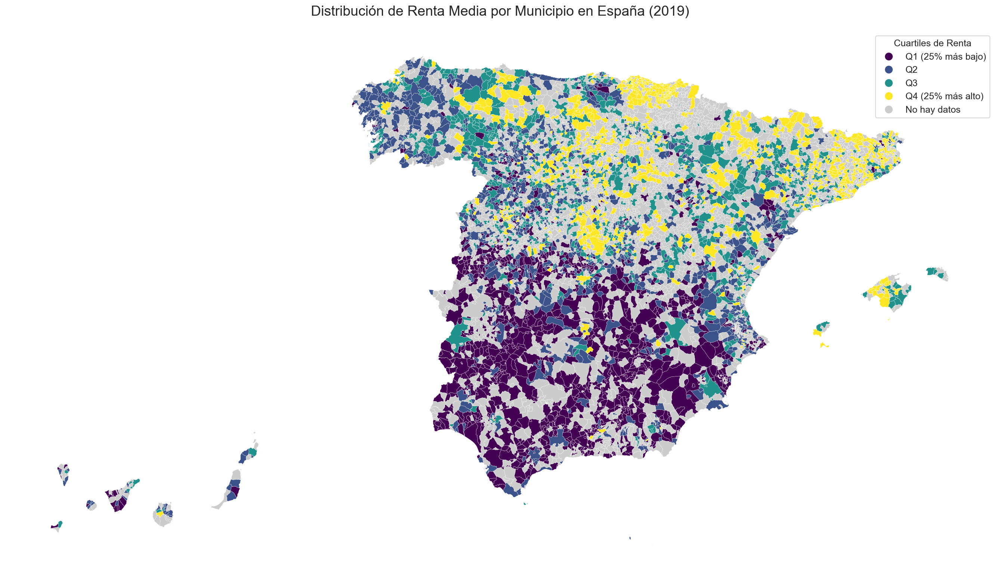

In [283]:
# 0. Conectar a la base de datos SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 1. Cargar el archivo GeoJSON correctamente
ROOT_DIR = Path(os.getcwd()).resolve()
while not (ROOT_DIR / "data").exists() and ROOT_DIR != ROOT_DIR.parent:
    ROOT_DIR = ROOT_DIR.parent

geojson_path = ROOT_DIR / "data" / "raw" / "Municipios_-3498985394491007638.geojson"

if not geojson_path.exists():
    raise FileNotFoundError(f"❌ No se encontró el archivo GeoJSON en: {geojson_path}")

mapa_munis = gpd.read_file(geojson_path)

# 2. Limpiar nombres de municipio
mapa_munis["Municipio"] = mapa_munis["NAMEUNIT"].str.upper().str.normalize("NFKD").str.replace("[^A-Z ]", "", regex=True)

# --- Desplazar Canarias ---

# Filtrar Canarias mediante coordenadas
canarias_mask = (
    (mapa_munis["geometry"].centroid.x < -10) &  # Longitud oeste
    (mapa_munis["geometry"].centroid.y < 40)     # Latitud sur
    )

# Desplazamiento más razonable
offset_x = 2  # Mover hacia el este (hacia la península)
offset_y = 7.75  # Mover hacia el norte

# Aplicar transformación solo si encontramos Canarias
if canarias_mask.any():
    mapa_munis.loc[canarias_mask, "geometry"] = mapa_munis.loc[canarias_mask, "geometry"].translate(
        xoff=offset_x, 
        yoff=offset_y
    )
    print("\n✅ Canarias desplazada correctamente")
else:
    print("\n⚠️ No se encontraron municipios de Canarias. Revisa los datos.")

# 3. Cargar datos de cuartiles desde SQLite - VERSIÓN ROBUSTA
try:
    renta_df = pd.read_sql_query("""
        SELECT Municipio, Cuartil_Renta_Media 
        FROM renta_y_participacion 
        WHERE Año = 2019 AND Cuartil_Renta_Media IS NOT NULL
    """, conn)
    print(f"\n✅ Datos de renta cargados: {len(renta_df)} registros válidos")
except Exception as e:
    print(f"\n❌ Error al cargar datos de renta: {e}")
    raise

conn.close()

# 4. Procesamiento seguro de cuartiles - VERSIÓN MEJORADA
# Agrupar asegurando que hay moda válida
renta_cuartiles = renta_df.groupby('Municipio')['Cuartil_Renta_Media'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'ND'  # 'ND' para No Disponible
).reset_index()

# 5. Merge con geometrías - VERSIÓN COMPLETA
# Asegurar que los nombres de municipio coinciden
mapa_munis['Municipio_Upper'] = mapa_munis['Municipio'].str.upper().str.strip()
renta_cuartiles['Municipio_Upper'] = renta_cuartiles['Municipio'].str.upper().str.strip()

# Hacer el merge
mapa_merge = mapa_munis.merge(
    renta_cuartiles,
    left_on='Municipio_Upper',
    right_on='Municipio_Upper',
    how='left'
)

# Rellenar valores faltantes con 'ND' (opcional)
mapa_merge['Cuartil_Renta_Media'] = mapa_merge['Cuartil_Renta_Media'].fillna('ND')

# 6. Visualización con manejo de valores faltantes - VERSIÓN MEJORADA
fig, ax = plt.subplots(figsize=(18, 14))

# Definir colores y categorías
cmap = {
    'Q1': '#440154',  # violeta oscuro
    'Q2': '#3b528b',  # azul
    'Q3': '#21918c',  # verde azulado
    'Q4': '#fde725',  # amarillo
    'ND': '#cccccc'   # gris para no disponibles
}

# Convertir a categoría ordenada
mapa_merge['Cuartil_Visual'] = pd.Categorical(
    mapa_merge['Cuartil_Renta_Media'],
    categories=['Q1', 'Q2', 'Q3', 'Q4', 'ND'],
    ordered=True
)

# Crear el mapa
mapa_merge.plot(
    column='Cuartil_Visual',
    ax=ax,
    categorical=True,
    legend=True,
    edgecolor='white',
    linewidth=0.2,
    cmap=ListedColormap([cmap[cat] for cat in mapa_merge['Cuartil_Visual'].cat.categories])
)

# Personalizar leyenda
legend = ax.get_legend()
if legend:
    legend.set_title("Cuartiles de Renta")
    for text in legend.get_texts():
        text.set_text({
            'Q1': 'Q1 (25% más bajo)',
            'Q2': 'Q2',
            'Q3': 'Q3',
            'Q4': 'Q4 (25% más alto)',
            'ND': 'No hay datos'
        }.get(text.get_text(), text.get_text()))

# Añadir título y metadatos
plt.title("Distribución de Renta Media por Municipio en España (2019)", fontsize=18, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

### 2.3 - Geomapa de distribución de renta mediana por municipio en España (2015)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\3133063865.py:34: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.x < -10) &
C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\3133063865.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.y < 40)



✅ Canarias desplazada correctamente

✅ Datos de renta cargados: 4364 registros válidos


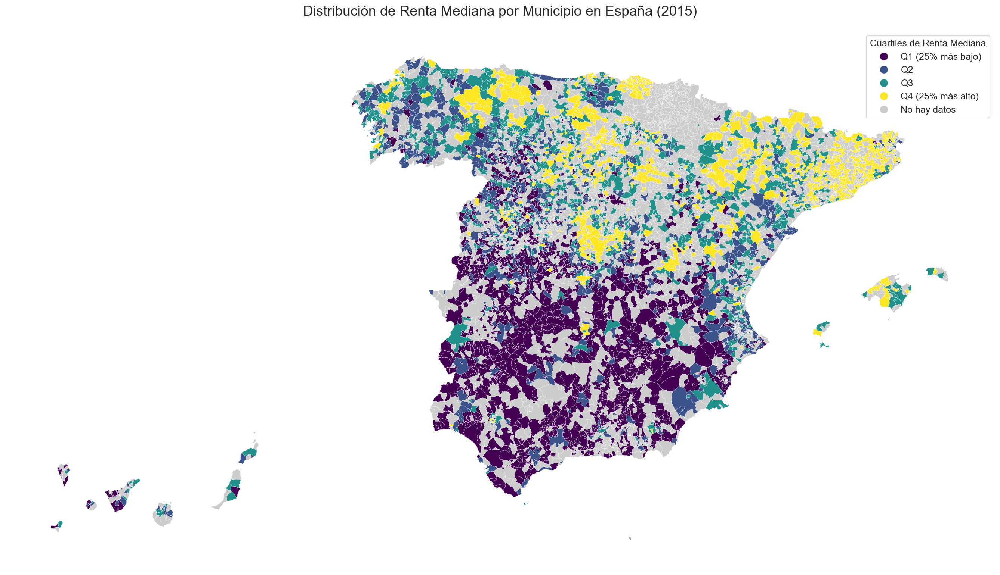

In [284]:
# 0. Conectar a la base de datos SQLite

try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 1. Cargar el archivo GeoJSON correctamente
ROOT_DIR = Path(os.getcwd()).resolve()
while not (ROOT_DIR / "data").exists() and ROOT_DIR != ROOT_DIR.parent:
    ROOT_DIR = ROOT_DIR.parent

geojson_path = ROOT_DIR / "data" / "raw" / "Municipios_-3498985394491007638.geojson"

if not geojson_path.exists():
    raise FileNotFoundError(f"❌ No se encontró el archivo GeoJSON en: {geojson_path}")

mapa_munis = gpd.read_file(geojson_path)

# 2. Limpiar nombres de municipio
mapa_munis["Municipio"] = mapa_munis["NAMEUNIT"].str.upper().str.normalize("NFKD").str.replace("[^A-Z ]", "", regex=True)

# --- Desplazar Canarias ---
canarias_mask = (
    (mapa_munis["geometry"].centroid.x < -10) &
    (mapa_munis["geometry"].centroid.y < 40)
)

offset_x = 2
offset_y = 7.75

if canarias_mask.any():
    mapa_munis.loc[canarias_mask, "geometry"] = mapa_munis.loc[canarias_mask, "geometry"].translate(
        xoff=offset_x,
        yoff=offset_y
    )
    print("\n✅ Canarias desplazada correctamente")
else:
    print("\n⚠️ No se encontraron municipios de Canarias. Revisa los datos.")

# 3. Cargar datos de cuartiles desde SQLite - usando Renta Mediana
try:
    renta_df = pd.read_sql_query("""
        SELECT Municipio, Cuartil_Renta_Mediana 
        FROM renta_y_participacion 
        WHERE Año = 2015 AND Cuartil_Renta_Mediana IS NOT NULL
    """, conn)
    print(f"\n✅ Datos de renta cargados: {len(renta_df)} registros válidos")
except Exception as e:
    print(f"\n❌ Error al cargar datos de renta: {e}")
    raise

conn.close()

# 4. Procesamiento seguro de cuartiles - usando Renta Mediana
renta_cuartiles = renta_df.groupby('Municipio')['Cuartil_Renta_Mediana'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'ND'
).reset_index()

# 5. Merge con geometrías
mapa_munis['Municipio_Upper'] = mapa_munis['Municipio'].str.upper().str.strip()
renta_cuartiles['Municipio_Upper'] = renta_cuartiles['Municipio'].str.upper().str.strip()

mapa_merge = mapa_munis.merge(
    renta_cuartiles,
    left_on='Municipio_Upper',
    right_on='Municipio_Upper',
    how='left'
)

mapa_merge['Cuartil_Renta_Mediana'] = mapa_merge['Cuartil_Renta_Mediana'].fillna('ND')

# 6. Visualización
fig, ax = plt.subplots(figsize=(18, 14))

cmap = {
    'Q1': '#440154',
    'Q2': '#3b528b',
    'Q3': '#21918c',
    'Q4': '#fde725',
    'ND': '#cccccc'
}

mapa_merge['Cuartil_Visual'] = pd.Categorical(
    mapa_merge['Cuartil_Renta_Mediana'],
    categories=['Q1', 'Q2', 'Q3', 'Q4', 'ND'],
    ordered=True
)

mapa_merge.plot(
    column='Cuartil_Visual',
    ax=ax,
    categorical=True,
    legend=True,
    edgecolor='white',
    linewidth=0.2,
    cmap=ListedColormap([cmap[cat] for cat in mapa_merge['Cuartil_Visual'].cat.categories])
)

legend = ax.get_legend()
if legend:
    legend.set_title("Cuartiles de Renta Mediana")
    for text in legend.get_texts():
        text.set_text({
            'Q1': 'Q1 (25% más bajo)',
            'Q2': 'Q2',
            'Q3': 'Q3',
            'Q4': 'Q4 (25% más alto)',
            'ND': 'No hay datos'
        }.get(text.get_text(), text.get_text()))

plt.title("Distribución de Renta Mediana por Municipio en España (2015)", fontsize=18, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()


### 2.4 - Geomapa de distribución de renta mediana por municipio en España (2019)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\393997772.py:34: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.x < -10) &
C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\393997772.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.y < 40)



✅ Canarias desplazada correctamente

✅ Datos de renta cargados: 11744 registros válidos


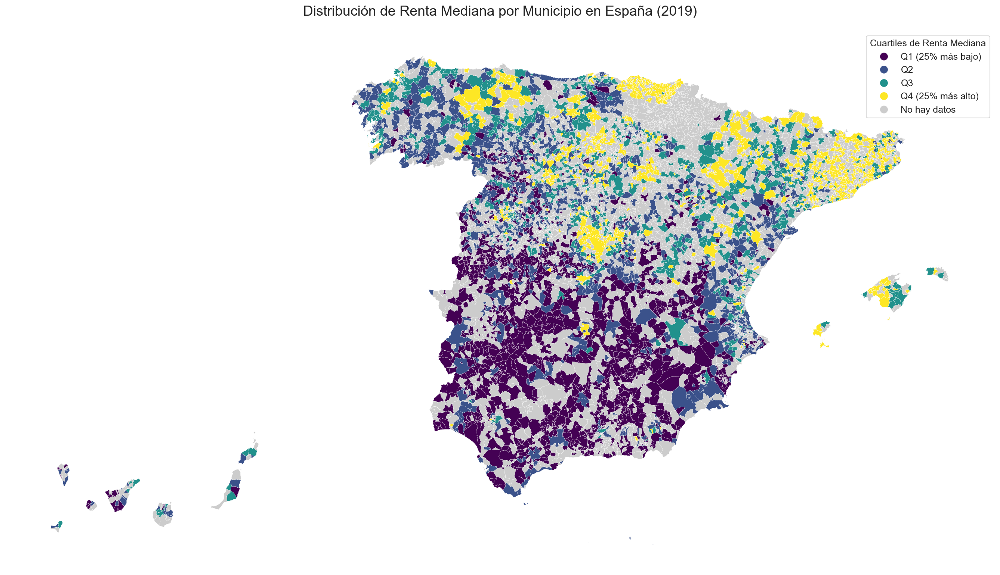

In [285]:
# 0. Conectar a la base de datos SQLite

try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 1. Cargar el archivo GeoJSON correctamente
ROOT_DIR = Path(os.getcwd()).resolve()
while not (ROOT_DIR / "data").exists() and ROOT_DIR != ROOT_DIR.parent:
    ROOT_DIR = ROOT_DIR.parent

geojson_path = ROOT_DIR / "data" / "raw" / "Municipios_-3498985394491007638.geojson"

if not geojson_path.exists():
    raise FileNotFoundError(f"❌ No se encontró el archivo GeoJSON en: {geojson_path}")

mapa_munis = gpd.read_file(geojson_path)

# 2. Limpiar nombres de municipio
mapa_munis["Municipio"] = mapa_munis["NAMEUNIT"].str.upper().str.normalize("NFKD").str.replace("[^A-Z ]", "", regex=True)

# --- Desplazar Canarias ---
canarias_mask = (
    (mapa_munis["geometry"].centroid.x < -10) &
    (mapa_munis["geometry"].centroid.y < 40)
)

offset_x = 2
offset_y = 7.75

if canarias_mask.any():
    mapa_munis.loc[canarias_mask, "geometry"] = mapa_munis.loc[canarias_mask, "geometry"].translate(
        xoff=offset_x,
        yoff=offset_y
    )
    print("\n✅ Canarias desplazada correctamente")
else:
    print("\n⚠️ No se encontraron municipios de Canarias. Revisa los datos.")

# 3. Cargar datos de cuartiles desde SQLite - usando Renta Mediana
try:
    renta_df = pd.read_sql_query("""
        SELECT Municipio, Cuartil_Renta_Mediana 
        FROM renta_y_participacion 
        WHERE Año = 2019 AND Cuartil_Renta_Mediana IS NOT NULL
    """, conn)
    print(f"\n✅ Datos de renta cargados: {len(renta_df)} registros válidos")
except Exception as e:
    print(f"\n❌ Error al cargar datos de renta: {e}")
    raise

conn.close()

# 4. Procesamiento seguro de cuartiles - usando Renta Mediana
renta_cuartiles = renta_df.groupby('Municipio')['Cuartil_Renta_Mediana'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'ND'
).reset_index()

# 5. Merge con geometrías
mapa_munis['Municipio_Upper'] = mapa_munis['Municipio'].str.upper().str.strip()
renta_cuartiles['Municipio_Upper'] = renta_cuartiles['Municipio'].str.upper().str.strip()

mapa_merge = mapa_munis.merge(
    renta_cuartiles,
    left_on='Municipio_Upper',
    right_on='Municipio_Upper',
    how='left'
)

mapa_merge['Cuartil_Renta_Mediana'] = mapa_merge['Cuartil_Renta_Mediana'].fillna('ND')

# 6. Visualización
fig, ax = plt.subplots(figsize=(18, 14))

cmap = {
    'Q1': '#440154',
    'Q2': '#3b528b',
    'Q3': '#21918c',
    'Q4': '#fde725',
    'ND': '#cccccc'
}

mapa_merge['Cuartil_Visual'] = pd.Categorical(
    mapa_merge['Cuartil_Renta_Mediana'],
    categories=['Q1', 'Q2', 'Q3', 'Q4', 'ND'],
    ordered=True
)

mapa_merge.plot(
    column='Cuartil_Visual',
    ax=ax,
    categorical=True,
    legend=True,
    edgecolor='white',
    linewidth=0.2,
    cmap=ListedColormap([cmap[cat] for cat in mapa_merge['Cuartil_Visual'].cat.categories])
)

legend = ax.get_legend()
if legend:
    legend.set_title("Cuartiles de Renta Mediana")
    for text in legend.get_texts():
        text.set_text({
            'Q1': 'Q1 (25% más bajo)',
            'Q2': 'Q2',
            'Q3': 'Q3',
            'Q4': 'Q4 (25% más alto)',
            'ND': 'No hay datos'
        }.get(text.get_text(), text.get_text()))

plt.title("Distribución de Renta Mediana por Municipio en España (2019)", fontsize=18, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

### 2.5 - Geomapa de participación por municipio en España (2015)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\3918892690.py:34: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.x < -10) &
C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\3918892690.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.y < 40)



✅ Canarias desplazada correctamente

✅ Datos de participacion cargados: 5479 registros válidos


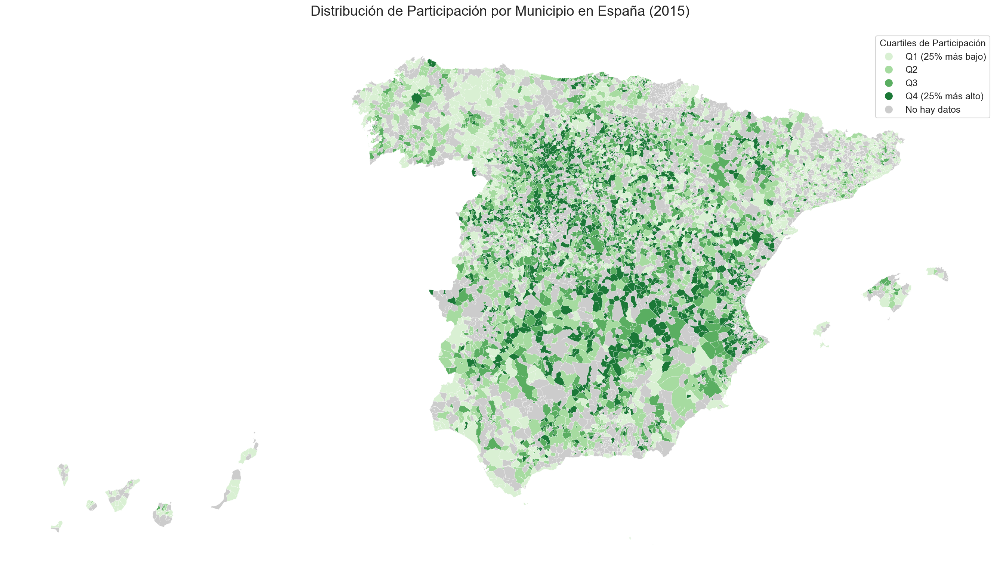

In [286]:
# 0. Conectar a la base de datos SQLite

try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 1. Cargar el archivo GeoJSON correctamente
ROOT_DIR = Path(os.getcwd()).resolve()
while not (ROOT_DIR / "data").exists() and ROOT_DIR != ROOT_DIR.parent:
    ROOT_DIR = ROOT_DIR.parent

geojson_path = ROOT_DIR / "data" / "raw" / "Municipios_-3498985394491007638.geojson"

if not geojson_path.exists():
    raise FileNotFoundError(f"❌ No se encontró el archivo GeoJSON en: {geojson_path}")

mapa_munis = gpd.read_file(geojson_path)

# 2. Limpiar nombres de municipio
mapa_munis["Municipio"] = mapa_munis["NAMEUNIT"].str.upper().str.normalize("NFKD").str.replace("[^A-Z ]", "", regex=True)

# --- Desplazar Canarias ---
canarias_mask = (
    (mapa_munis["geometry"].centroid.x < -10) &
    (mapa_munis["geometry"].centroid.y < 40)
)

offset_x = 2
offset_y = 7.75

if canarias_mask.any():
    mapa_munis.loc[canarias_mask, "geometry"] = mapa_munis.loc[canarias_mask, "geometry"].translate(
        xoff=offset_x,
        yoff=offset_y
    )
    print("\n✅ Canarias desplazada correctamente")
else:
    print("\n⚠️ No se encontraron municipios de Canarias. Revisa los datos.")

# 3. Cargar datos de cuartiles desde SQLite - usando Renta Mediana
try:
    renta_df = pd.read_sql_query("""
        SELECT Municipio, Cuartil_Participacion 
        FROM renta_y_participacion 
        WHERE Año = 2015 AND Cuartil_Participacion IS NOT NULL
    """, conn)
    print(f"\n✅ Datos de participacion cargados: {len(renta_df)} registros válidos")
except Exception as e:
    print(f"\n❌ Error al cargar datos de participacion: {e}")
    raise

conn.close()

# 4. Procesamiento seguro de cuartiles - usando Renta Mediana
renta_cuartiles = renta_df.groupby('Municipio')['Cuartil_Participacion'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'ND'
).reset_index()

# 5. Merge con geometrías
mapa_munis['Municipio_Upper'] = mapa_munis['Municipio'].str.upper().str.strip()
renta_cuartiles['Municipio_Upper'] = renta_cuartiles['Municipio'].str.upper().str.strip()

mapa_merge = mapa_munis.merge(
    renta_cuartiles,
    left_on='Municipio_Upper',
    right_on='Municipio_Upper',
    how='left'
)

mapa_merge['Cuartil_Participacion'] = mapa_merge['Cuartil_Participacion'].fillna('ND')

# 6. Visualización
fig, ax = plt.subplots(figsize=(18, 14))

cmap = {
    'Q1': '#d9f0d3',  # Verde muy claro
    'Q2': '#a6dba0',  # Verde claro medio
    'Q3': '#5aae61',  # Verde medio-oscuro
    'Q4': '#1b7837',  # Verde oscuro
    'ND': '#cccccc'   # Gris para "No hay datos"
}

mapa_merge['Cuartil_Visual'] = pd.Categorical(
    mapa_merge['Cuartil_Participacion'],
    categories=['Q1', 'Q2', 'Q3', 'Q4', 'ND'],
    ordered=True
)

mapa_merge.plot(
    column='Cuartil_Visual',
    ax=ax,
    categorical=True,
    legend=True,
    edgecolor='white',
    linewidth=0.2,
    cmap=ListedColormap([cmap[cat] for cat in mapa_merge['Cuartil_Visual'].cat.categories])
)

legend = ax.get_legend()
if legend:
    legend.set_title("Cuartiles de Participación")
    for text in legend.get_texts():
        text.set_text({
            'Q1': 'Q1 (25% más bajo)',
            'Q2': 'Q2',
            'Q3': 'Q3',
            'Q4': 'Q4 (25% más alto)',
            'ND': 'No hay datos'
        }.get(text.get_text(), text.get_text()))

plt.title("Distribución de Participación por Municipio en España (2015)", fontsize=18, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

### 2.6 - Geomapa de participación por municipio en España (2019)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\3841029637.py:34: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.x < -10) &
C:\Users\Eru Iluvatar\AppData\Local\Temp\ipykernel_5472\3841029637.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (mapa_munis["geometry"].centroid.y < 40)



✅ Canarias desplazada correctamente

✅ Datos de renta cargados: 7382 registros válidos


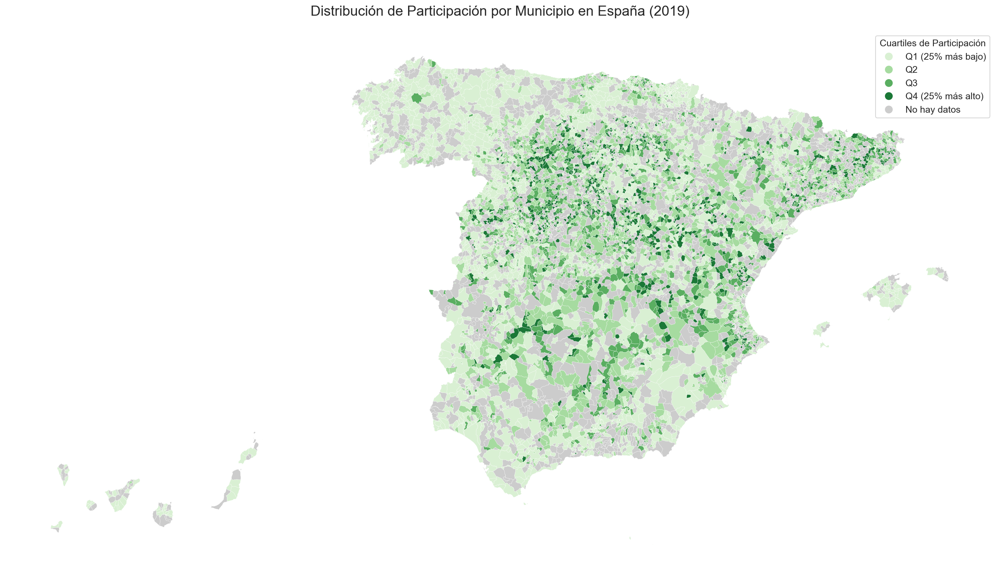

In [295]:
# 0. Conectar a la base de datos SQLite

try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 1. Cargar el archivo GeoJSON correctamente
ROOT_DIR = Path(os.getcwd()).resolve()
while not (ROOT_DIR / "data").exists() and ROOT_DIR != ROOT_DIR.parent:
    ROOT_DIR = ROOT_DIR.parent

geojson_path = ROOT_DIR / "data" / "raw" / "Municipios_-3498985394491007638.geojson"

if not geojson_path.exists():
    raise FileNotFoundError(f"❌ No se encontró el archivo GeoJSON en: {geojson_path}")

mapa_munis = gpd.read_file(geojson_path)

# 2. Limpiar nombres de municipio
mapa_munis["Municipio"] = mapa_munis["NAMEUNIT"].str.upper().str.normalize("NFKD").str.replace("[^A-Z ]", "", regex=True)

# --- Desplazar Canarias ---
canarias_mask = (
    (mapa_munis["geometry"].centroid.x < -10) &
    (mapa_munis["geometry"].centroid.y < 40)
)

offset_x = 2
offset_y = 7.75

if canarias_mask.any():
    mapa_munis.loc[canarias_mask, "geometry"] = mapa_munis.loc[canarias_mask, "geometry"].translate(
        xoff=offset_x,
        yoff=offset_y
    )
    print("\n✅ Canarias desplazada correctamente")
else:
    print("\n⚠️ No se encontraron municipios de Canarias. Revisa los datos.")

# 3. Cargar datos de cuartiles desde SQLite - usando Renta Mediana
try:
    renta_df = pd.read_sql_query("""
        SELECT Municipio, Cuartil_Participacion 
        FROM renta_y_participacion 
        WHERE Año = 2019 AND Mes_Elecciones = 'Noviembre' AND Cuartil_Participacion IS NOT NULL
    """, conn)
    print(f"\n✅ Datos de renta cargados: {len(renta_df)} registros válidos")
except Exception as e:
    print(f"\n❌ Error al cargar datos de renta: {e}")
    raise

conn.close()

# 4. Procesamiento seguro de cuartiles - usando Renta Mediana
renta_cuartiles = renta_df.groupby('Municipio')['Cuartil_Participacion'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'ND'
).reset_index()

# 5. Merge con geometrías
mapa_munis['Municipio_Upper'] = mapa_munis['Municipio'].str.upper().str.strip()
renta_cuartiles['Municipio_Upper'] = renta_cuartiles['Municipio'].str.upper().str.strip()

mapa_merge = mapa_munis.merge(
    renta_cuartiles,
    left_on='Municipio_Upper',
    right_on='Municipio_Upper',
    how='left'
)

mapa_merge['Cuartil_Participacion'] = mapa_merge['Cuartil_Participacion'].fillna('ND')

# 6. Visualización
fig, ax = plt.subplots(figsize=(18, 14))

cmap = {
    'Q1': '#d9f0d3',  # Verde muy claro
    'Q2': '#a6dba0',  # Verde claro medio
    'Q3': '#5aae61',  # Verde medio-oscuro
    'Q4': '#1b7837',  # Verde oscuro
    'ND': '#cccccc'   # Gris para "No hay datos"
}

mapa_merge['Cuartil_Visual'] = pd.Categorical(
    mapa_merge['Cuartil_Participacion'],
    categories=['Q1', 'Q2', 'Q3', 'Q4', 'ND'],
    ordered=True
)

mapa_merge.plot(
    column='Cuartil_Visual',
    ax=ax,
    categorical=True,
    legend=True,
    edgecolor='white',
    linewidth=0.2,
    cmap=ListedColormap([cmap[cat] for cat in mapa_merge['Cuartil_Visual'].cat.categories])
)

legend = ax.get_legend()
if legend:
    legend.set_title("Cuartiles de Participación")
    for text in legend.get_texts():
        text.set_text({
            'Q1': 'Q1 (25% más bajo)',
            'Q2': 'Q2',
            'Q3': 'Q3',
            'Q4': 'Q4 (25% más alto)',
            'ND': 'No hay datos'
        }.get(text.get_text(), text.get_text()))

plt.title("Distribución de Participación por Municipio en España (2019)", fontsize=18, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

### 2.7 - Diagrama de Espaguetis: Evolución participación por municipios de renta baja 2015-19

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


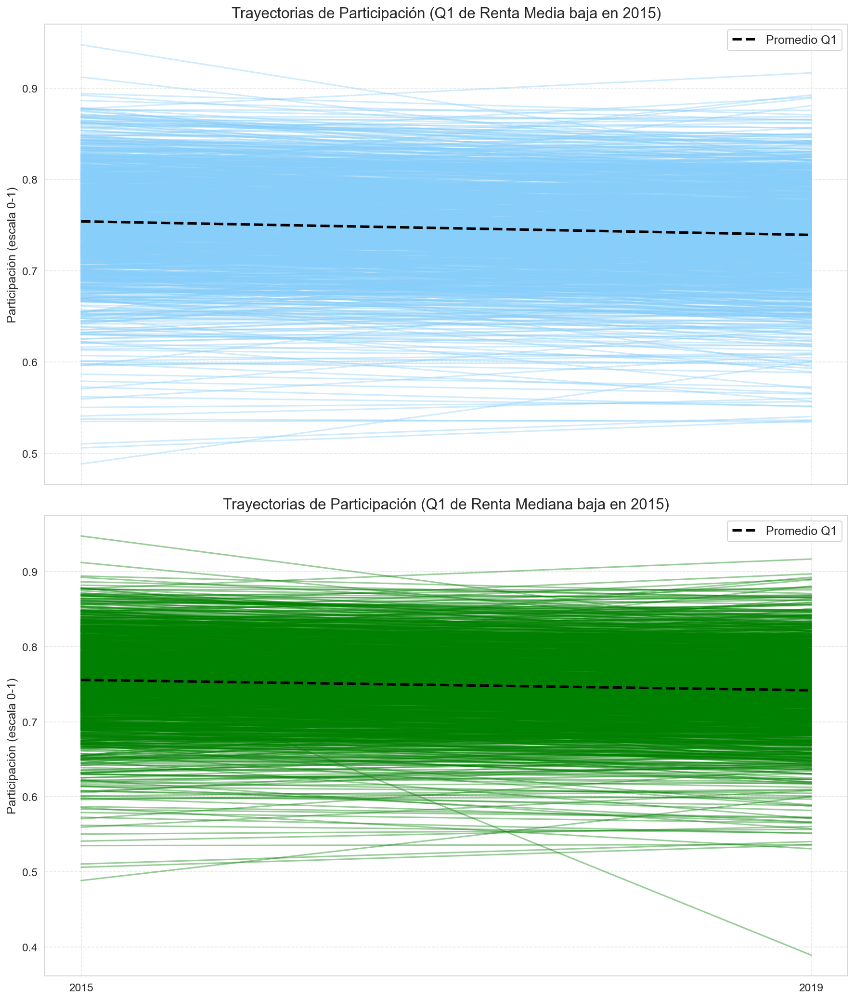

In [294]:
# 0. Conectar a la base de datos SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# 1. Cargar los datos desde la base de datos
try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# --- Cargar datos de renta media ---
query_media = """
    SELECT Municipio, Año, Participación, Cuartil_Renta_Media
    FROM Renta_y_Participacion
    WHERE Año IN (2015, 2019)
      AND Participación IS NOT NULL
      AND Cuartil_Renta_Media IS NOT NULL
"""
df_media = pd.read_sql_query(query_media, conn)
municipios_q1_media = df_media[(df_media["Año"] == 2015) & (df_media["Cuartil_Renta_Media"] == "Q1")]["Municipio"].unique()
df_media_grouped = (
    df_media[df_media["Municipio"].isin(municipios_q1_media)]
    .groupby(["Municipio", "Año"])["Participación"]
    .mean()
    .reset_index()
)
pivot_media = df_media_grouped.pivot(index="Municipio", columns="Año", values="Participación").dropna()

# --- Cargar datos de renta mediana ---
query_mediana = """
    SELECT Municipio, Año, Participación, Cuartil_Renta_Mediana
    FROM Renta_y_Participacion
    WHERE Año IN (2015, 2019)
      AND Participación IS NOT NULL
      AND Cuartil_Renta_Mediana IS NOT NULL
"""
df_mediana = pd.read_sql_query(query_mediana, conn)
municipios_q1_mediana = df_mediana[(df_mediana["Año"] == 2015) & (df_mediana["Cuartil_Renta_Mediana"] == "Q1")]["Municipio"].unique()
df_mediana_grouped = (
    df_mediana[df_mediana["Municipio"].isin(municipios_q1_mediana)]
    .groupby(["Municipio", "Año"])["Participación"]
    .mean()
    .reset_index()
)
pivot_mediana = df_mediana_grouped.pivot(index="Municipio", columns="Año", values="Participación").dropna()

conn.close()

# --- Crear figura con dos subplots (primero renta media, luego mediana) ---
fig, axes = plt.subplots(2, 1, figsize=(12, 14), sharex=True)

# Gráfico 1: Renta Media
for _, row in pivot_media.iterrows():
    axes[0].plot([2015, 2019], [row[2015], row[2019]], alpha=0.4, color="#87CEFA")  # azul claro
avg_media_2015 = pivot_media[2015].mean()
avg_media_2019 = pivot_media[2019].mean()
axes[0].plot([2015, 2019], [avg_media_2015, avg_media_2019], color="black", linewidth=2.5, linestyle='--', label="Promedio Q1")
axes[0].set_title("Trayectorias de Participación (Q1 de Renta Media baja en 2015)", fontsize=15)
axes[0].set_ylabel("Participación (escala 0-1)")
axes[0].legend()
axes[0].grid(True, linestyle="--", alpha=0.5)

# Gráfico 2: Renta Mediana
for _, row in pivot_mediana.iterrows():
    axes[1].plot([2015, 2019], [row[2015], row[2019]], alpha=0.4, color="green")
avg_mediana_2015 = pivot_mediana[2015].mean()
avg_mediana_2019 = pivot_mediana[2019].mean()
axes[1].plot([2015, 2019], [avg_mediana_2015, avg_mediana_2019], color="black", linewidth=2.5, linestyle='--', label="Promedio Q1")
axes[1].set_title("Trayectorias de Participación (Q1 de Renta Mediana baja en 2015)", fontsize=15)
axes[1].set_ylabel("Participación (escala 0-1)")
axes[1].set_xticks([2015, 2019])
axes[1].legend()
axes[1].grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


### 2.8 - Diagrama de Espaguetis: Evolución participación por municipios de renta media 2015-19

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


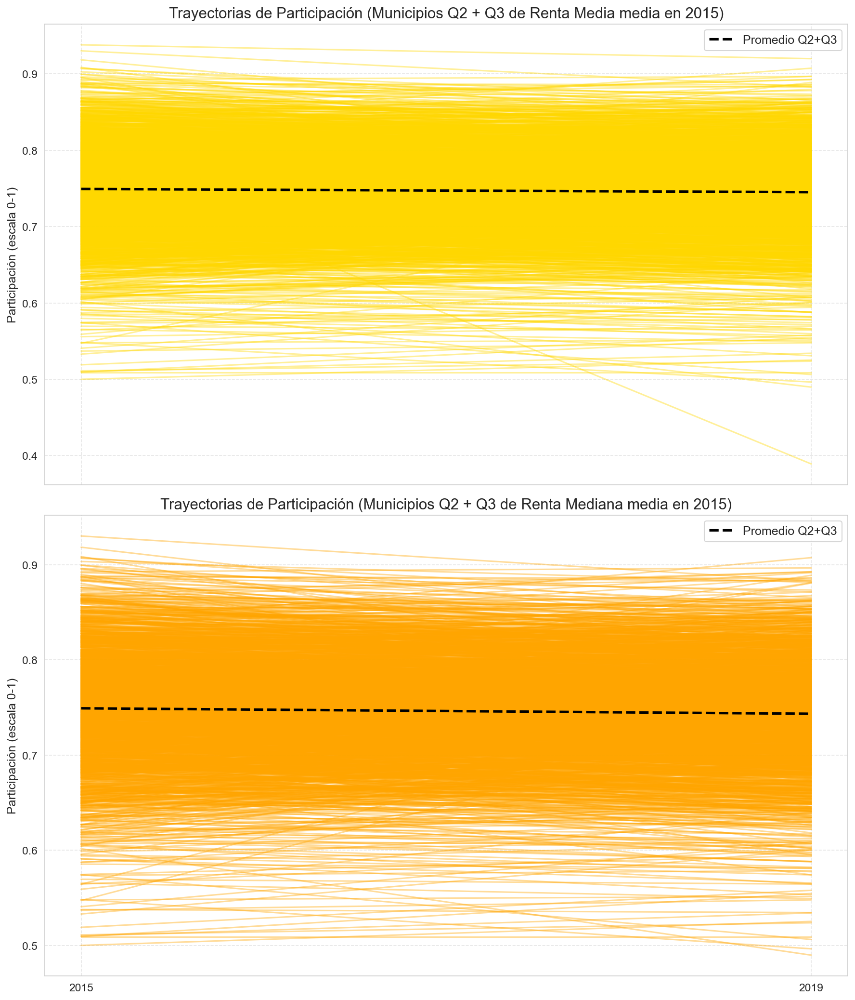

In [292]:
# 0. Conectar a la base de datos SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# 1. Cargar los datos desde la base de datos
try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# === FUNCIONES AUXILIARES ===

def preparar_datos_quartiles(query, columna_cuartil, cuartiles_incluidos):
    df = pd.read_sql_query(query, conn)
    municipios = df[
        (df["Año"] == 2015) & (df[columna_cuartil].isin(cuartiles_incluidos))
    ]["Municipio"].unique()

    df_filtrado = df[df["Municipio"].isin(municipios)]
    df_grouped = (
        df_filtrado.groupby(["Municipio", "Año"])["Participación"]
        .mean()
        .reset_index()
    )
    pivot = df_grouped.pivot(index="Municipio", columns="Año", values="Participación").dropna()
    return pivot


# === QUERY RENTA MEDIA ===
query_media = """
    SELECT Municipio, Año, Participación, Cuartil_Renta_Media
    FROM Renta_y_Participacion
    WHERE Año IN (2015, 2019)
      AND Participación IS NOT NULL
      AND Cuartil_Renta_Media IS NOT NULL
"""

pivot_media = preparar_datos_quartiles(
    query_media, "Cuartil_Renta_Media", ["Q2", "Q3"]
)

# === QUERY RENTA MEDIANA ===
query_mediana = """
    SELECT Municipio, Año, Participación, Cuartil_Renta_Mediana
    FROM Renta_y_Participacion
    WHERE Año IN (2015, 2019)
      AND Participación IS NOT NULL
      AND Cuartil_Renta_Mediana IS NOT NULL
"""

pivot_mediana = preparar_datos_quartiles(
    query_mediana, "Cuartil_Renta_Mediana", ["Q2", "Q3"]
)

conn.close()

# === PLOTS ===

fig, axes = plt.subplots(2, 1, figsize=(12, 14), sharex=True)

# --- RENTA MEDIA (amarillo) ---
for _, row in pivot_media.iterrows():
    axes[0].plot([2015, 2019], [row[2015], row[2019]], alpha=0.4, color="#FFD700")  # amarillo
avg_media_2015 = pivot_media[2015].mean()
avg_media_2019 = pivot_media[2019].mean()
axes[0].plot([2015, 2019], [avg_media_2015, avg_media_2019], color="black", linewidth=2.5, linestyle='--', label="Promedio Q2+Q3")
axes[0].set_title("Trayectorias de Participación (Municipios Q2 + Q3 de Renta Media media en 2015)", fontsize=15)
axes[0].set_ylabel("Participación (escala 0-1)")
axes[0].legend()
axes[0].grid(True, linestyle="--", alpha=0.5)

# --- RENTA MEDIANA (naranja) ---
for _, row in pivot_mediana.iterrows():
    axes[1].plot([2015, 2019], [row[2015], row[2019]], alpha=0.4, color="#FFA500")  # naranja
avg_mediana_2015 = pivot_mediana[2015].mean()
avg_mediana_2019 = pivot_mediana[2019].mean()
axes[1].plot([2015, 2019], [avg_mediana_2015, avg_mediana_2019], color="black", linewidth=2.5, linestyle='--', label="Promedio Q2+Q3")
axes[1].set_title("Trayectorias de Participación (Municipios Q2 + Q3 de Renta Mediana media en 2015)", fontsize=15)
axes[1].set_ylabel("Participación (escala 0-1)")
axes[1].set_xticks([2015, 2019])
axes[1].legend()
axes[1].grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

### 2.9 - Diagrama de Espaguetis: Evolución participación por municipios de renta alta 2015-19

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


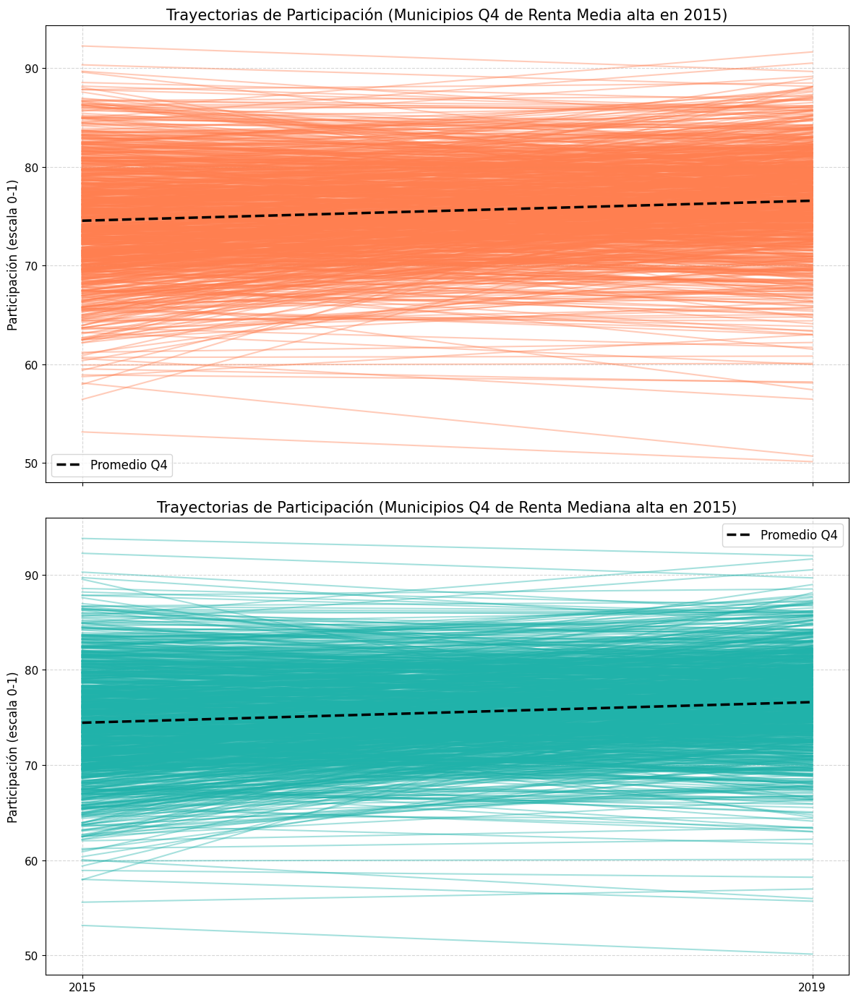

In [50]:
# 0. Conectar a la base de datos SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# 1. Cargar los datos desde la base de datos
try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# Función para extraer y procesar municipios en Q4
def preparar_datos_q4(query, columna_cuartil):
    df = pd.read_sql_query(query, conn)
    municipios_q4 = df[
        (df["Año"] == 2015) & (df[columna_cuartil] == "Q4")
    ]["Municipio"].unique()

    df_filtrado = df[df["Municipio"].isin(municipios_q4)]
    df_grouped = (
        df_filtrado.groupby(["Municipio", "Año"])["Participación"]
        .mean()
        .reset_index()
    )
    pivot = df_grouped.pivot(index="Municipio", columns="Año", values="Participación").dropna()
    return pivot

# --- RENTA MEDIA ---
query_media = """
    SELECT Municipio, Año, Participación, Cuartil_Renta_Media
    FROM Renta_y_Participacion
    WHERE Año IN (2015, 2019)
      AND Participación IS NOT NULL
      AND Cuartil_Renta_Media IS NOT NULL
"""
pivot_media = preparar_datos_q4(query_media, "Cuartil_Renta_Media")

# --- RENTA MEDIANA ---
query_mediana = """
    SELECT Municipio, Año, Participación, Cuartil_Renta_Mediana
    FROM Renta_y_Participacion
    WHERE Año IN (2015, 2019)
      AND Participación IS NOT NULL
      AND Cuartil_Renta_Mediana IS NOT NULL
"""
pivot_mediana = preparar_datos_q4(query_mediana, "Cuartil_Renta_Mediana")

conn.close()

# === PLOTS ===

fig, axes = plt.subplots(2, 1, figsize=(12, 14), sharex=True)

# --- RENTA MEDIA (Rojo coral) ---
for _, row in pivot_media.iterrows():
    axes[0].plot([2015, 2019], [row[2015], row[2019]], alpha=0.4, color="#FF7F50")
avg_media_2015 = pivot_media[2015].mean()
avg_media_2019 = pivot_media[2019].mean()
axes[0].plot([2015, 2019], [avg_media_2015, avg_media_2019], color="black", linewidth=2.5, linestyle='--', label="Promedio Q4")
axes[0].set_title("Trayectorias de Participación (Municipios Q4 de Renta Media alta en 2015)", fontsize=15)
axes[0].set_ylabel("Participación (escala 0-1)")
axes[0].legend()
axes[0].grid(True, linestyle="--", alpha=0.5)

# --- RENTA MEDIANA (Azul verdoso) ---
for _, row in pivot_mediana.iterrows():
    axes[1].plot([2015, 2019], [row[2015], row[2019]], alpha=0.4, color="#20B2AA")  # Azul verdoso
avg_mediana_2015 = pivot_mediana[2015].mean()
avg_mediana_2019 = pivot_mediana[2019].mean()
axes[1].plot([2015, 2019], [avg_mediana_2015, avg_mediana_2019], color="black", linewidth=2.5, linestyle='--', label="Promedio Q4")
axes[1].set_title("Trayectorias de Participación (Municipios Q4 de Renta Mediana alta en 2015)", fontsize=15)
axes[1].set_ylabel("Participación (escala 0-1)")
axes[1].set_xticks([2015, 2019])
axes[1].legend()
axes[1].grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

### 2.10 - Gráfico de densidad: Participación electoral municipal por cuartiles de renta media y mediana (2015)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


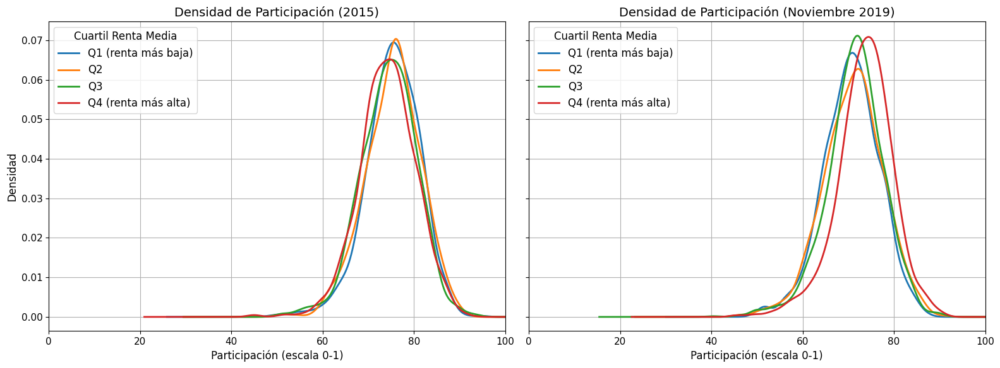

In [ ]:
# 0. Conectar a la base de datos SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# 1. Cargar los datos desde la base de datos
try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 2. Filtrar por los años y meses deseados
df_2015 = df[df['Año'] == 2015]
df_2019_noviembre = df[(df['Año'] == 2019) & (df['Mes_Elecciones'] == 'Noviembre')]

# 3. Crear los diagramas de densidad
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Etiquetas descriptivas para los cuartiles
cuartil_labels = {
    'Q1': 'Q1 (renta más baja)',
    'Q2': 'Q2',
    'Q3': 'Q3',
    'Q4': 'Q4 (renta más alta)'
}

# Diagrama de densidad para 2015
for cuartil in sorted([c for c in df_2015['Cuartil_Renta_Media'].unique() if pd.notnull(c)]):
    subset = df_2015[df_2015['Cuartil_Renta_Media'] == cuartil]
    subset['Participación'].astype(float).plot(kind='kde', ax=axes[0], label=cuartil_labels[cuartil], linewidth=2)

axes[0].set_title('Densidad de Participación (2015)')
axes[0].set_xlabel('Participación (%)')
axes[0].set_ylabel('Densidad')
axes[0].set_xlim(0, 100)
axes[0].legend(title='Cuartil Renta Media')
axes[0].grid(True)

# Diagrama de densidad para noviembre 2019
for cuartil in sorted([c for c in df_2019_noviembre['Cuartil_Renta_Media'].unique() if pd.notnull(c)]):
    subset = df_2019_noviembre[df_2019_noviembre['Cuartil_Renta_Media'] == cuartil]
    subset['Participación'].astype(float).plot(kind='kde', ax=axes[1], label=cuartil_labels[cuartil], linewidth=2)

axes[1].set_title('Densidad de Participación (Noviembre 2019)')
axes[1].set_xlabel('Participación (%)')
axes[1].set_xlim(0, 100)
axes[1].legend(title='Cuartil Renta Media')
axes[1].grid(True)

plt.tight_layout()
plt.show()

### 2.11 - Gráfico de densidad: Participación electoral municipal por cuartiles de renta media y mediana (2019)

Conexión exitosa a la base de datos: d:\AAACarpetasEmigradasDeC\Downloads\Data Science\elecciones-espana\data\processed\Renta_y_Participacion.sqlite
Datos cargados exitosamente desde la base de datos.


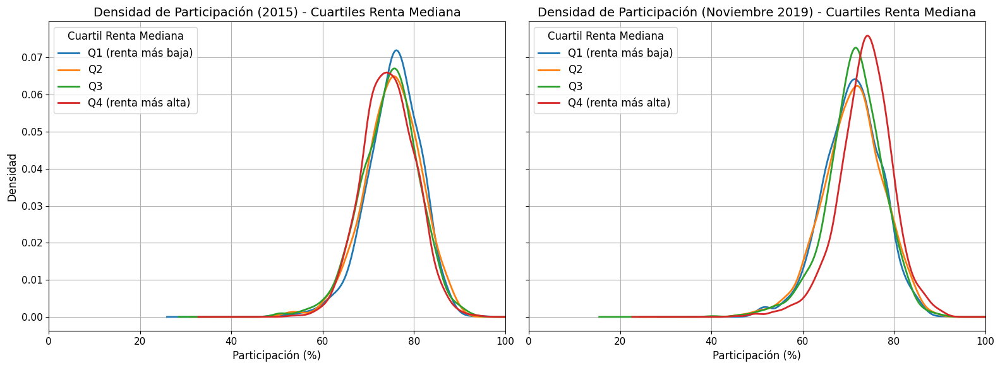

In [59]:
# 0. Conectar a la base de datos SQLite
try:
    conn = sqlite3.connect(DB_PATH)
    print(f"Conexión exitosa a la base de datos: {DB_PATH}")
except sqlite3.DatabaseError as e:
    print(f"Error al conectar con la base de datos: {e}")
    raise

# 1. Cargar los datos desde la base de datos
try:
    df = pd.read_sql_query("SELECT * FROM renta_y_participacion", conn)
    print("Datos cargados exitosamente desde la base de datos.")
except Exception as e:
    print(f"Error al cargar los datos: {e}")
    raise

# 2. Filtrar por los años y meses deseados
df_2015 = df[df['Año'] == 2015]
df_2019_noviembre = df[(df['Año'] == 2019) & (df['Mes_Elecciones'] == 'Noviembre')]

# 3. Crear los diagramas de densidad
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Etiquetas descriptivas para los cuartiles
cuartil_labels = {
    'Q1': 'Q1 (renta más baja)',
    'Q2': 'Q2',
    'Q3': 'Q3',
    'Q4': 'Q4 (renta más alta)'
}

# Diagrama de densidad para 2015 (Renta Mediana del Hogar)
for cuartil in sorted([c for c in df_2015['Cuartil_Renta_Mediana'].unique() if pd.notnull(c)]):
    subset = df_2015[df_2015['Cuartil_Renta_Mediana'] == cuartil]
    subset['Participación'].astype(float).plot(kind='kde', ax=axes[0], label=cuartil_labels[cuartil], linewidth=2)

axes[0].set_title('Densidad de Participación (2015) - Cuartiles Renta Mediana')
axes[0].set_xlabel('Participación (%)')
axes[0].set_ylabel('Densidad')
axes[0].set_xlim(0, 100)
axes[0].legend(title='Cuartil Renta Mediana')
axes[0].grid(True)

# Diagrama de densidad para noviembre 2019 (Renta Mediana del Hogar)
for cuartil in sorted([c for c in df_2019_noviembre['Cuartil_Renta_Mediana'].unique() if pd.notnull(c)]):
    subset = df_2019_noviembre[df_2019_noviembre['Cuartil_Renta_Mediana'] == cuartil]
    subset['Participación'].astype(float).plot(kind='kde', ax=axes[1], label=cuartil_labels[cuartil], linewidth=2)

axes[1].set_title('Densidad de Participación (Noviembre 2019) - Cuartiles Renta Mediana')
axes[1].set_xlabel('Participación (%)')
axes[1].set_xlim(0, 100)
axes[1].legend(title='Cuartil Renta Mediana')
axes[1].grid(True)

plt.tight_layout()
plt.show()
